In [1]:
## needed to first call  in terminal:
! systemctl stop opentrons-robot-server 

In [2]:
import opentrons.execute
import time
protocol = opentrons.execute.get_protocol_api("2.21")

/data/robot_settings.json not found. Loading defaults


In [3]:
from pydantic import BaseModel, Field
from typing import Optional, List
from enum import Enum

from datetime import datetime, timezone
import numpy as np
from lmfit import Model
import json

import matplotlib.pyplot as plt

from threading import Thread
import os 

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/lmfit/confidence.py:6: UserWarning: A NumPy version >=1.23.5 and <2.5.0 is required for this version of SciPy (detected version 1.22.3)
  from scipy.optimize import root_scalar


In [4]:
from opentrons.types import Point, Location ## for arbitrary movements
from threading import Thread ## for concurrent action + measurement
import asyncio
import time

## sensor stuff: 
from opentrons_hardware.sensors.types import SensorDataType, EnvironmentSensorDataType
from opentrons_hardware.drivers.can_bus import DriverSettings, settings, build

from opentrons_hardware.drivers.can_bus.can_messenger import CanMessenger
from opentrons_hardware.drivers.can_bus.abstract_driver import AbstractCanDriver
from opentrons_hardware.firmware_bindings.constants import NodeId, SensorType, SensorId
from opentrons_hardware.sensors import sensor_driver, sensor_types

driver_settings = DriverSettings(
        interface=settings.DEFAULT_INTERFACE,
        port=settings.DEFAULT_PORT,
        host=settings.DEFAULT_HOST,
        bit_rate=settings.DEFAULT_BITRATE,
        channel=settings.DEFAULT_CHANNEL,
    )
node_id = NodeId.pipette_left # from https://github.com/Opentrons/opentrons/blob/edge/hardware/opentrons_hardware/scripts/sensors.py
pressure_sensor = sensor_types.PressureSensor.build(SensorId.S0, node_id)
s_driver = sensor_driver.SensorDriver()


In [5]:
# labware
plate = protocol.load_labware(
    "corning_96_wellplate_360ul_flat", location="C2"
)
tiprack = protocol.load_labware(
    "opentrons_flex_96_tiprack_1000ul", location="B2"
)
trash = protocol.load_trash_bin(location="A3")

raw_material_plate = protocol.load_labware(
    "opentrons_6_tuberack_falcon_50ml_conical", location="C1"
)

# pipettes
left_pipette = protocol.load_instrument(
    "flex_1channel_1000", mount="left", tip_racks=[tiprack]
)


In [6]:
# home gantry
protocol.home()

In [7]:
## some utility functions for tip handling

soap_aspirate_location = raw_material_plate["A1"].bottom(z = 10)
soap_wait_location = raw_material_plate["A1"].bottom(z = 40)
water_aspirate_location = raw_material_plate["B1"].bottom(z = 10)

def pick_up_soap_tip():
    left_pipette.pick_up_tip(location = tiprack.wells()[90])
    
def return_soap_tip():
    left_pipette.drop_tip(location = tiprack.wells()[90])
    
def pick_up_water_tip():
    left_pipette.pick_up_tip(location = tiprack.wells()[91])
    
def return_water_tip():
    left_pipette.drop_tip(location = tiprack.wells()[91])    

if False: 
    ## testing
    pick_up_soap_tip()
    return_soap_tip()
    pick_up_water_tip()
    return_water_tip()

In [8]:
### class to controll pressure sensor independently 
class PressureReader:
    def __init__(self):
        
        self.measure_thread = None
        self.stop_measurement = False
        self.driver = build.driver(driver_settings)
        self.last_pressure = None
    async def measure_pressure_async(self):
        """measure pressure until self. stop_measurement is True"""
        self.stop_measurement = False
        t_start = time.time()
        async with build.driver(driver_settings) as driver:
            messenger = CanMessenger(driver=driver)
            messenger.start()
            while not self.stop_measurement:
                data = await s_driver.read(messenger, pressure_sensor, offset=False, timeout=10)
                self.last_pressure = data.to_float()
                
    def measure_pressure_loop(self):
        asyncio.run(self.measure_pressure_async())
                
    def start_measuring(self):
            
        self.measure_thread = Thread(target = self.measure_pressure_loop)
        self.measure_thread.start()
        
    def measure_once(self, timeout = 10):
        self.last_pressure = None
        self.start_measuring()
        t_start = time.time()
        while self.last_pressure is None:
            #print("last_pressure:", self.last_pressure)
            #print("time passed:", time.time()-t_start)
            if self.last_pressure is not None:
                break
            if time.time()-t_start > timeout:
                self.stop_measurement = True
                raise Exception("no pressure could be read, timeout!")
            time.sleep(0.01)
        self.stop_measurement = True
        self.measure_thread.join()
        return self.last_pressure
                
if False: 
    pressure_reader = PressureReader()
    print(pressure_reader.measure_once())
    print(pressure_reader.stop_measurement)
    print(pressure_reader.measure_thread)
    time.sleep(0.1)
    print(pressure_reader.measure_thread)
    
    for i in range(10):
        print(pressure_reader.measure_once())

In [9]:
## function to aspirate viscous liquid and set reduce pressure afterwards, to not suck in further air. 



def aspirate_pressureless(volume_ul, 
                                      location, 
                                      overaspirate = True,
                                      overaspirate_volume_ul = 40,
                                      wait_s = 15,
                                      finish_threshold = -100, 
                                      fast_threshold = -1000, 
                                      fast_volume_ul=10, 
                                      slow_volume_ul = 1):
    """aspirates, waits, removes overpressure"""
    print("aspiration target: ", volume_ul, " ul")
    if overaspirate: 
        volume_ul = volume_ul+ overaspirate_volume_ul
        if volume_ul > 200:
            volume_ul = 200
    left_pipette.aspirate(volume_ul ,location)
    print("aspirated. wait for settling")
    time.sleep(wait_s)
    pressure_reader = PressureReader()
    
    pressure = pressure_reader.measure_once()
    while pressure < finish_threshold:

        if pressure < fast_threshold:
            left_pipette.dispense(fast_volume_ul)
        else:
            left_pipette.dispense(slow_volume_ul)
        pressure = pressure_reader.measure_once()
        #print("current pressure:", pressure)
    print('finally aspirated ', left_pipette.current_volume, ' ul')
    
## aspirate, wait for 10s.

if False: 
    #return_soap_tip()
    #pick_up_soap_tip()
    aspirate_pressureless(198, soap_aspirate_location)
    left_pipette.move_to(soap_wait_location)

In [9]:
#left_pipette.move_to(soap_wait_location)
#left_pipette.dispense(left_pipette.current_volume, rate= 0.01)
#time.sleep(10)
#left_pipette.blow_out()
#left_pipette.drop_tip()

In [112]:
#left_pipette.dispense(left_pipette.current_volume, soap_aspirate_location)
#left_pipette.blow_out()
#pressure_reader.measure_once()
#left_pipette.blow_out()
#protocol.home()
#left_pipette.drop_tip()

<InstrumentContext: p1000_single_v3.5 in LEFT>

In [10]:
## some utility functions for material transfer



def transfer_soap_to_well(volume_ul = None, n_well=None, wait_time_s = 30, acceptable_rest_ul = 10): ## wait time must be pretty long if actual soap is being transferred
    """transfer soap to well with index n"""
    
    ## todo: aspirate more than necessary, to pull the pipette out of the liquid with zero pressure. maybe use pressure sensor to check.
    if volume_ul is None or n_well is None: 
        raise Exception("volume or well not specified, do nothing")
        
    print(f"transfer {volume_ul} ul soap to well {n_well}")
    if volume_ul ==0:
        return
    pick_up_soap_tip()
    
    amount_left = volume_ul
    
    while amount_left> acceptable_rest_ul:
        if acceptable_rest_ul > 150:
            amount_ul = 150
        else:
            amount_ul = amount_left
        aspirate_pressureless(amount_ul, soap_aspirate_location) ## 200 ul will not be reached, typically 150 ul
        amount_left -= left_pipette.current_volume
        ## move 30 mm up and 
        left_pipette.move_to(soap_wait_location)
        time.sleep(wait_time_s) #wait another wait time to get rid of soap sticking to the outside of the pipette.

        target_well = plate.wells()[n_well]
        left_pipette.dispense(left_pipette.current_volume, target_well.bottom(z=10), rate= 0.2)
        time.sleep(wait_time_s/2)
        for i in range(3):
            left_pipette.blow_out()
            time.sleep(wait_time_s/6) ## wait for liquid to settle. important for soap. Sleep after blowout, otherwise pressure is not good enough.

    return_soap_tip()
    
def transfer_water_to_well(volume_ul = None, n_well=None, wait_time_s = 0.3):
    """transfer water to well with index n"""
    if volume_ul is None or n_well is None: 
        raise Exception("volume or well not specified, do nothing")
        
    print(f"transfer {volume_ul} ul water to well {n_well}")
    pick_up_water_tip()
    left_pipette.aspirate(volume_ul, water_aspirate_location)
    
    time.sleep(wait_time_s) ## wait for liquid to settle. can be shorter for water
    
    target_well = plate.wells()[n_well]
    left_pipette.dispense(volume_ul, target_well.bottom(z=10))
    left_pipette.blow_out()
    return_water_tip()

if False: 
    ## testing
    #volumes = [50, 110, 200]
    #for i, volume in enumerate(volumes):
    #    transfer_soap_to_well(volume_ul=volume, n_well=i+6, wait_time_s = 20)
    transfer_water_to_well(volume_ul=200, n_well=10)


In [11]:
# Liquid preparation function

def prepare_mix(n_well, soap_fraction = 0.5, water_fraction = 0.5, total_volume_ul = 200):
    """prepare a mix, here from soap and water"""
    if abs(1-soap_fraction - water_fraction) > 0.001:
        raise Exception("fractions do not add up to 1")
        
    # lets limit it to 200 ul for now -> liquid surface well below 
    if total_volume_ul > 200:
        raise Exception("volume too high, currently limited to 200 ul")
    
    soap_volume_ul = total_volume_ul*soap_fraction
    water_volume_ul = total_volume_ul*water_fraction
    
    
    transfer_soap_to_well(n_well=n_well,
                          volume_ul=soap_volume_ul)
    
    ## transfer liquids
    transfer_water_to_well(n_well=n_well, 
                          volume_ul=water_volume_ul)
    
if False: 
    ## testing
    prepare_mix(1, soap_fraction = 0.9, water_fraction = 0.1)


In [12]:
class ModeEnum(str, Enum):
    idle = "idle"
    aspirate = "aspirate"
    wait_after_aspirate = "wait_after_aspirate"
    dispense = "dispense"
    wait_after_dispense = "wait_after_dispense"

class MeasurementPoint(BaseModel):
    seconds_since_start: float = Field(description = "seconds since the start of this measurement")
    utc_timestamp: str = Field(description = "timestamp (in utc) taken immediately after pressure value has been received. ")
    pressure_au: float = Field(description = "pressure reading in arbitrary units (they are not know, so far)")
    mode: ModeEnum = Field(description = "current mode, e.g. aspirate, wait_after_aspirate, dispense,...") 
    
class ViscosityProxyResult(BaseModel):
    raw_data: List[MeasurementPoint] = Field(default = [], description = "List containing all measurement points")
    fit_report_aspirate: Optional[str] = Field(description = "Fit report as created by LMFit, for decay after aspirating")
    decay_time_aspirate: Optional[float] = Field(description = "Decay time, resulting from fit, for decay after aspirating")
    fit_report_dispense: Optional[str] = Field(description = "Fit report as created by LMFit, for decay after dispensing")
    decay_time_dispense: Optional[float] = Field(description = "Decay time, resulting from fit, for decay after dispensing")
    pressure_integral_aspirate: Optional[float] = Field(description = "-time-integrated pressure including aspiration and pressure drop")
    pressure_integral_dispense: Optional[float] = Field(description = "time-integrated pressure including dispensing and pressure drop")
    pressure_integral_corrected: Optional[float] = Field(description = "time-integrated pressure average between aspiration and dispensing, (correct for gravity)")
    derivative_proxy_offset: Optional[float] = Field(description = "viscosity proxy generated by derivative divided by pressure value, zero_pressure part (offset)")
    derivative_proxy_slope: Optional[float] = Field(description = "viscosity proxy generated by derivative divided by pressure value, slope")
    derivative_proxy_mean: Optional[float] = Field(description = "viscosity proxy generated by derivative divided by pressure value mean of measured")  
  
class ViscosityProxyEvaluator():
    """a class containing funcitons for pressure measurment and simultaneous movement"""
    def __init__(self, pipette = left_pipette):
        
        self.pipette = pipette
        self.stop_measurment = False
        self.driver = build.driver(driver_settings)
        self.current_mode = ModeEnum.idle
        self.result = ViscosityProxyResult()
        
        
    async def measure_pressure_async(self):
        """measure pressure until self. stop_measurement is True"""
        self.stop_measurement = False
        t_start = time.time()
        self.last_pressure_au = None
        async with build.driver(driver_settings) as driver:
            messenger = CanMessenger(driver=driver)
            messenger.start()
            while not self.stop_measurement:
                data = await s_driver.read(messenger, pressure_sensor, offset=False, timeout=10)
                self.last_pressure_au = data.to_float()
                #print("current volume:",self.pipette.current_volume) # this does not work live.
                point = MeasurementPoint(
                    seconds_since_start = (time.time()-t_start),
                    utc_timestamp = datetime.now(timezone.utc).astimezone(timezone.utc).strftime('%Y-%m-%d %H:%M:%S.%f'),
                    pressure_au = data.to_float(),
                    mode = self.current_mode,
                )
                self.result.raw_data.append(point)
                
    def measure_pressure(self):
        asyncio.run(self.measure_pressure_async())
        
    def measure_viscosity_proxies(self, n_well = None, location = None, volume_ul = 50,
                                  pre_aspirate_ul = 10, pre_aspirate_settle_time_s = 2,
                                  settle_time_s = 10, p_thresh_asp = -100, p_thresh_disp = 100):
        
        
        if location is not None: 
            location = location
        else:
            location = plate.wells()[n_well]
        ## pre-aspirate to already break surface tension.
        aspirate_pressureless(pre_aspirate_ul, location, wait_s = pre_aspirate_settle_time_s, overaspirate = False)
        
        measurement_points = []
        
        ## parallel thread that reads pressures and documents
        t = Thread(target = self.measure_pressure)
        t.start()
        
        ## aspirate
        self.current_mode = ModeEnum.aspirate
        self.pipette.aspirate(volume_ul, location)
        
        ## wait after aspiration until pressure increases above p_thresh_asp
        self.current_mode = ModeEnum.wait_after_aspirate
        time.sleep(settle_time_s)
        #t_wait_start = time.time()
        #while self.last_pressure_au < p_thresh_asp or time.time()-t_wait_start < settle_time_s:
        #    time.sleep(0.1)
        
        ## dispense 
        self.current_mode = ModeEnum.dispense
        self.pipette.dispense(volume_ul, location)
        
        ## wait after aspiration until pressure increases above p_thresh_asp
        self.current_mode = ModeEnum.wait_after_dispense
        time.sleep(settle_time_s)
        #t_wait_start = time.time()
        #while self.last_pressure_au > p_thresh_disp or time.time()-t_wait_start < settle_time_s:
        #    time.sleep(0.1)
        
        ## give thread signal to stop measuring: 
        self.stop_measurement = True
        t.join()
        print("measurement finished")
        
        self.pipette.dispense(self.pipette.current_volume) ## needed due to pre-aspiration
        ## evaluate
        self.visualize_overview()
        self.evaluate_decay_times()
        self.evaluate_pressure_integral()
        self.evaluate_derivative()
        self.save_result()
        
        return self.result

    def save_result(self):
        result_dict = self.result.dict()
        start_timestamp = self.result.raw_data[0].utc_timestamp
    
        
        with open(f"data/result_{start_timestamp.replace('.','_').replace(':','_')}.json", 'w') as f:
            json.dump(result_dict, f, indent=4)
            
    def visualize_overview(self):
        
        times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data)]
        pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data)]
        
        a_times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate]
        a_pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate]
        
        d_times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_dispense]
        d_pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_dispense]
        
        
        
        ## overview
        fig, ax = plt.subplots()
        
        ax.plot(times, pressures, color = "blue")
        ax.scatter(times, pressures, color = "blue")
        
        ax.plot(a_times, a_pressures, color = "black")
        ax.scatter(a_times, a_pressures, color = "black")
        
        
        ax.plot(d_times, d_pressures, color = "black")
        ax.scatter(d_times, d_pressures, color = "black")
        
        ax.grid(True)
        ax.set_xlabel("time in s")
        ax.set_ylabel("pressure in a.u.")
        
        start_timestamp = self.result.raw_data[0].utc_timestamp
        fig.savefig(f"visualizations/overview_utc_{start_timestamp.replace('.','_').replace(':','_')}.png")
    
    def evaluate_decay_times(self):
        
        ## prepare plot
        fig, (ax_asp, ax_disp) = plt.subplots(ncols = 2, figsize = (8,4))
        
        ## Create a model
        def exponential_curve(x, a, tau, c):
            return a*np.exp(-x/tau) + c

        model = Model(exponential_curve)
        
        # evaluate decay time from aspiration:
        times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate]
        # zero times 
        times = np.array(times)
        times = times-np.min(times)
        pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate]
        
        ## disregard some of the first values:
        #times = times[5::]
        #pressures = pressures[5::]

        # Set initial parameters and limits
        params = model.make_params(a=-500, tau=0.01, c=0)  # Set initial parameters, specific for aspiration (negative pressures)
        params['tau'].min = 0
        params['tau'].max = 100
        params['c'].min = -9000
        params['c'].max = 9000
        params['a'].min = -9000 ## this can only be so close if times are shifted to begin with zero. then a is the maximum value, which is limited by pressure sensor
        params['a'].max = 9000
        
        
        # Fit the model to aspiration data

        result = model.fit(pressures,#[i_start: i_stop],
                              x=times,#[i_start: i_stop],
                              params=params)
        print(result.fit_report())

        # Print the fit report
        self.result.fit_report_aspirate = result.fit_report()
        self.result.decay_time_aspirate = result.best_values['tau']

        ax_asp.plot(times,pressures)
        ax_asp.plot(times,#[i_start: i_stop],
                result.best_fit, color="red", label=r'$\tau_i$ = {:.2f} s'.format(result.best_values['tau']) + r' $c$ = {:.2f} '
                                                                                              r'a.u.'.format(
                             result.best_values['c']))
        ax_asp.scatter(times,pressures)
        ax_asp.set_xlabel("time in s")
        ax_asp.set_ylabel("pressure in a.u.")
        ax_asp.legend()
        ax_asp.grid(True)
        
        ## same for dispense:
        # evaluate decay time from wait after dispense:
        times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_dispense]
        # zero times 
        times = np.array(times)
        times = times-np.min(times)
        pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_dispense]
        
        ## disregard some of the first values:
        #times = times[5::]
        #pressures = pressures[5::]
        
        # Set initial parameters and limits
        params = model.make_params(a=500, tau=0.01, c=0)  # Set initial parameters, specific for dispense (positive pressures)
        params['tau'].min = 0
        params['tau'].max = 100
        params['c'].min = -9000
        params['c'].max = 9000
        params['a'].min = -9000 ## this can only be so close if times are shifted to begin with zero. then a is the maximum value, which is limited by pressure sensor
        params['a'].max = 9000
        
        
        # Fit the model to aspiration data

        result = model.fit(pressures,#[i_start: i_stop],
                              x=times,#[i_start: i_stop],
                              params=params)
        print(result.fit_report())

        # Print the fit report
        self.result.fit_report_dispense = result.fit_report()
        self.result.decay_time_dispense = result.best_values['tau']

        ax_disp.plot(times,pressures)
        ax_disp.plot(times,#[i_start: i_stop],
                result.best_fit, color="red", label=r'$\tau_i$ = {:.2f} s'.format(result.best_values['tau']) + r' $c$ = {:.2f} '
                                                                                              r'a.u.'.format(
                             result.best_values['c']))
        ax_disp.scatter(times,pressures)
        ax_disp.set_xlabel("time in s")
        ax_disp.set_ylabel("pressure in a.u.")
        ax_disp.legend()
        ax_disp.grid(True)
        
        start_timestamp = self.result.raw_data[0].utc_timestamp
        fig.savefig(f"visualizations/aspirate_decay_utc_{start_timestamp.replace('.','_').replace(':','_')}.png")
    
    
    def evaluate_pressure_integral(self):
                
        
        # evaluate pressure integral for aspiration
        #
        times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate or point.mode == ModeEnum.aspirate]
        # zero times 
        times = np.array(times)
        times = times-np.min(times)
        pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate or point.mode == ModeEnum.aspirate]
        pressures = np.array(pressures)
        
        # cut preparation time (aspirate does not start immediately)
        i_start = np.argmax(pressures<-400)
        
        times = times[i_start::]
        pressures = pressures[i_start::]
        
        # cut off long tail
        i_stop = np.argmax(pressures>-400) ## quite high in the case of bubble formation
        if i_stop ==0: 
            i_stop = len(pressures) ## for high viscosities the pressure never drops in the given time
        times = times[0:i_stop]
        pressures = pressures[0:i_stop]
        
        # calculate time-integral of pressures
        print("min, max of times (asp):", min(times), max(times))
        aspiration_integral = np.trapz(pressures,times)
        print("aspiration_integral = ", aspiration_integral)
        
        ## same for dispense:
        # evaluate decay time from wait after dispense:
        times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_dispense or point.mode == ModeEnum.dispense]
        # zero times 
        times = np.array(times)
        times = times-np.min(times)
        pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_dispense or point.mode == ModeEnum.dispense]
        pressures = np.array(pressures)
        
        # cut preparation time (aspirate does not start immediately)
        i_start = np.argmax(pressures>400)
        
        times = times[i_start::]
        pressures = pressures[i_start::]
        
        # cut off long tail
        i_stop = np.argmax(pressures<400) ## first pressure below 400
        if i_stop ==0: 
            i_stop = len(pressures) ## for high viscosities the pressure never drops in the given time
        times = times[0:i_stop]
        pressures = pressures[0:i_stop]
        print("min, max of times(disp):", min(times), max(times))
        dispense_integral = np.trapz(pressures,times)
        print("dispense_integral = ", dispense_integral)
        
        ## document results
        self.result.pressure_integral_aspirate = aspiration_integral
        self.result.pressure_integral_dispense = dispense_integral
        self.result.pressure_integral_corrected = (-aspiration_integral + dispense_integral)/2 ## averaging for cancellation of gravity error.
        print("corrected integral: ", self.result.pressure_integral_corrected )
        
    def evaluate_derivative(self):
        # evaluate / visualize (dp/dt) / p(t)
        #
        times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate]
        # zero times 
        times = np.array(times)
        times = times-np.min(times)
        pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate]
        pressures = np.array(pressures)
        
        # cut preparation time (aspirate does not start immediately)
        i_start = np.argmax(pressures<-400)
        
        times = times[i_start::]
        pressures = pressures[i_start::]
        
        # cut off long tail
        i_stop = np.argmax(pressures>-400) ## quite high in the case of bubble formation
        if i_stop ==0: 
            i_stop = len(pressures) ## for high viscosities the pressure never drops in the given time
            
        times = times[0:i_stop]
        pressures = pressures[0:i_stop]
        dp=pressures[1::]-pressures[:len(pressures)-1]
        dt=times[1::]-times[:len(pressures)-1]
        dp_dt = dp/dt
        
             
        p_ = (pressures[1::]+pressures[:len(pressures)-1])/2
        t_ = (times[1::]+times[:len(pressures)-1])/2
        visc_proxy = -p_/dp
        
        ## averaging since derivatives are noisy
        nbins = 10
        i_edge = np.array([int(i) for i in np.linspace(0,len(dp), nbins+1)])
        dp_dt_avg = np.array([np.mean(dp_dt[i_edge[j]:i_edge[j+1]]) for j in range(nbins)])
        p_avg = np.array([np.mean(p_[i_edge[j]:i_edge[j+1]]) for j in range(nbins)])
        t_avg = np.array([np.mean(t_[i_edge[j]:i_edge[j+1]]) for j in range(nbins)])
        visc_proxy_avg = np.array([np.mean(visc_proxy[i_edge[j]:i_edge[j+1]]) for j in range(nbins)])
        
        ## fit a line to visc disregarding nan values
        
        idx = np.isfinite(p_) & np.isfinite(visc_proxy)

        [proxy_slope, proxy_val] = np.polyfit(p_[idx], visc_proxy[idx], 1)
        
        self.result.derivative_proxy_offset = proxy_val
        self.result.derivative_proxy_slope = proxy_slope
        
        idx = np.isfinite(visc_proxy)
        self.result.derivative_proxy_mean = np.nanmean(visc_proxy[idx]) ## inf can occur, has to be filterd
        
        print("proxy_offset, proxy_slope, proxy_mean", proxy_val, proxy_slope, self.result.derivative_proxy_mean)
        
        ## visualize derivative and its division by pressure
        
        fig, (p_ax, dp_ax, dpp_ax, visc_p_ax) = plt.subplots(nrows = 4, figsize= (6,10))

        p_ax.plot(times,pressures)
        p_ax.set_ylabel("pressure")

        dp_ax.plot(t_, dp_dt)
        dp_ax.plot(t_avg, dp_dt_avg, color="black")
        dp_ax.scatter(t_avg, dp_dt_avg, color="black")
        dp_ax.set_ylabel("dp/dt (t)")

        dpp_ax.plot(t_,p_ / dp_dt )
        dpp_ax.set_ylabel(" p(t) / dp/dt")
        
        dpp_ax.plot(t_avg, p_avg / dp_dt_avg, color="black")
        dpp_ax.scatter(t_avg, p_avg / dp_dt_avg, color="black")
        
        visc_p_ax.plot(np.abs(p_), visc_proxy )
        visc_p_ax.plot(np.abs(p_avg), visc_proxy_avg, color="black")
        visc_p_ax.scatter(np.abs(p_avg), visc_proxy_avg, color="black")
        
        visc_p_ax.plot(np.abs(p_), proxy_val + proxy_slope*p_, color = "red",
                       label = r"$mp + b$ with m={} ".format(proxy_slope)+ r"b={}".format(proxy_val))
        
        visc_p_ax.set_ylabel("-p(t) / dp/dt")
        visc_p_ax.set_ylim(0,1.2*np.nanmax( proxy_val + proxy_slope*p_))
        visc_p_ax.set_xlabel("abs(p(t))")  
        visc_p_ax.set_title("mean = "+str(self.result.derivative_proxy_mean))
        visc_p_ax.grid(True)
        visc_p_ax.legend()
    
        fig.show()
        start_timestamp = self.result.raw_data[0].utc_timestamp
        plt.tight_layout()

        fig.savefig(f"visualizations/derivatives_asp_utc_{start_timestamp.replace('.','_').replace(':','_')}.png")

        
if False:
    
    n_well = 0
    
    results = []
    for i in range(1):
        evaluator = ViscosityProxyEvaluator()
        #evaluator.pipette.pick_up_tip(location = tiprack.wells()[n_well])
        #result = evaluator.measure_viscosity_proxies(n_well = n_well, volume_ul = 200, settle_time_s = 10)
        
        result = evaluator.measure_viscosity_proxies(location = raw_material_plate["A1"].bottom(z = 25),
                                                     volume_ul = 100, settle_time_s = 10)
        results.append(result)
        
        

aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  4.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 1906
    # variables        = 3
    chi-square         = 25312683.1
    reduced chi-square = 13301.4625
    Akaike info crit   = 18101.6670
    Bayesian info crit = 18118.3253
    R-squared          = 0.99537066
[[Variables]]
    a:   -6620.42763 +/- 10.5759245 (0.16%) (init = -500)
    tau:  7.87501547 +/- 0.03300492 (0.42%) (init = 0.01)
    c:   -536.535609 +/- 7.03077902 (1.31%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8465
    C(a, tau) = +0.2057
    C(a, c)   = -0.1951
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 51
    # data points      = 1936
    # variables        = 3
    chi-square         = 6.8207e+08
    reduced chi-

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


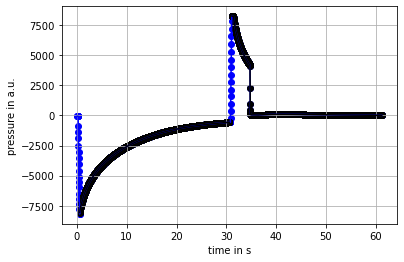

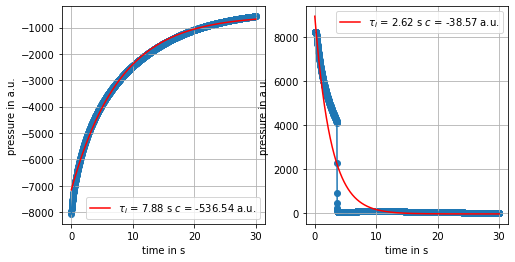

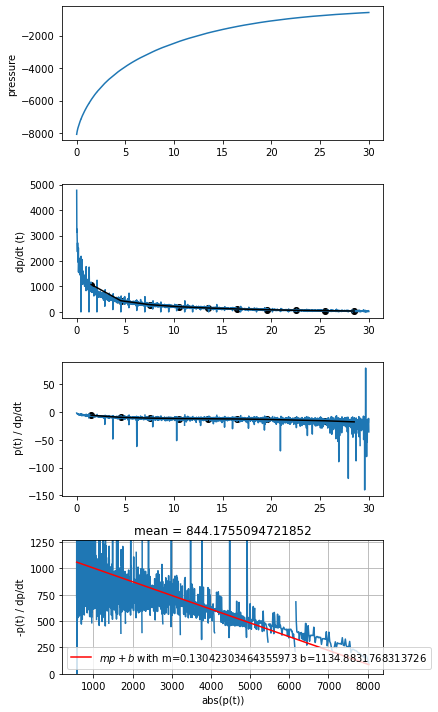

In [17]:
## check if shear-thinning observable with soap?
if False:
    
    n_well = 1
    
    results = []
    for i in range(1):
        evaluator = ViscosityProxyEvaluator()
        evaluator.pipette.pick_up_tip(location = tiprack.wells()[n_well])
        result = evaluator.measure_viscosity_proxies(n_well = n_well, volume_ul = 200, settle_time_s = 30)
        results.append(result)
        

aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 640
    # variables        = 3
    chi-square         = 9186826.55
    reduced chi-square = 14422.0197
    Akaike info crit   = 6131.96028
    Bayesian info crit = 6145.34469
    R-squared          = 0.99726565
[[Variables]]
    a:   -8845.22567 +/- 18.3765716 (0.21%) (init = -500)
    tau:  3.18493237 +/- 0.01999504 (0.63%) (init = 0.01)
    c:    537.715847 +/- 16.5077670 (3.07%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8952
    C(a, c)   = -0.3879
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 46
    # data points      = 641
    # variables        = 3
    chi-square         = 6.5601e+08
    reduced chi-square = 1028235.53
    A

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


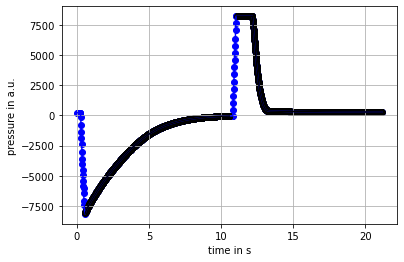

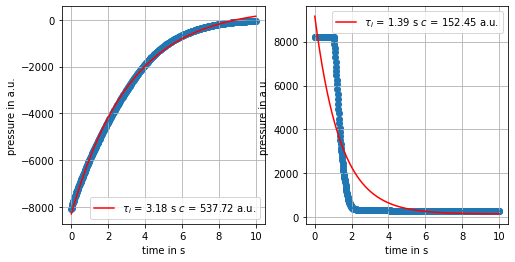

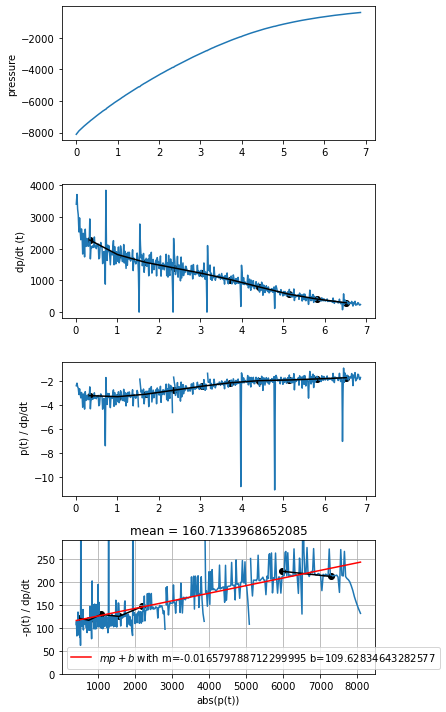

In [32]:
## check if shear-thickening observable with corn starch?
if False:
    
    corn_starch_location = raw_material_plate.wells()[2].bottom(z=10)
    
    results = []
    for i in range(1):
        evaluator = ViscosityProxyEvaluator()
        evaluator.pipette.pick_up_tip(location = tiprack.wells()[8])
        result = evaluator.measure_viscosity_proxies(location = corn_starch_location, volume_ul = 200, settle_time_s = 10)
        results.append(result)

aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 46
    # data points      = 627
    # variables        = 3
    chi-square         = 8577692.40
    reduced chi-square = 13746.3019
    Akaike info crit   = 5977.37805
    Bayesian info crit = 5990.70089
    R-squared          = 0.99258911
[[Variables]]
    a:   -6637.88841 +/- 28.5663341 (0.43%) (init = -500)
    tau:  1.00847635 +/- 0.00720196 (0.71%) (init = 0.01)
    c:   -252.651930 +/- 6.07734157 (2.41%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5949
    C(tau, c) = +0.5048
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 42
    # data points      = 645
    # variables        = 3
    chi-square         = 2984662.86
    reduced chi-square = 4649.00757
    A

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 42
    # data points      = 632
    # variables        = 3
    chi-square         = 5305945.83
    reduced chi-square = 8435.52596
    Akaike info crit   = 5716.40390
    Bayesian info crit = 5729.75057
    R-squared          = 0.99673033
[[Variables]]
    a:   -7535.27880 +/- 21.1233020 (0.28%) (init = -500)
    tau:  1.17357795 +/- 0.00560130 (0.48%) (init = 0.01)
    c:   -192.606315 +/- 5.00187366 (2.60%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5800
    C(tau, c) = +0.5519
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 46
    # data points      = 641
    # variables        = 3
    chi-square         = 1081345.57
    reduced chi-square = 1694.89901
    A

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 646
    # variables        = 3
    chi-square         = 4413797.89
    reduced chi-square = 6864.38240
    Akaike info crit   = 5709.82249
    Bayesian info crit = 5723.23488
    R-squared          = 0.99745553
[[Variables]]
    a:   -6589.35298 +/- 14.2147262 (0.22%) (init = -500)
    tau:  2.13436052 +/- 0.01028045 (0.48%) (init = 0.01)
    c:   -213.578510 +/- 6.76520441 (3.17%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.7758
    C(a, tau) = +0.3841
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 47
    # data points      = 639
    # variables        = 3
    chi-square         = 7.8484e+08
    reduced chi-square = 1234032.00
    A

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 634
    # variables        = 3
    chi-square         = 1403176.13
    reduced chi-square = 2223.73396
    Akaike info crit   = 4889.19476
    Bayesian info crit = 4902.55091
    R-squared          = 0.99935453
[[Variables]]
    a:   -7173.16188 +/- 7.25999135 (0.10%) (init = -500)
    tau:  2.98820311 +/- 0.00876551 (0.29%) (init = 0.01)
    c:   -337.911591 +/- 5.96481234 (1.77%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8821
    C(a, c)   = -0.3266
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 53
    # data points      = 640
    # variables        = 3
    chi-square         = 6.8001e+08
    reduced chi-square = 1067527.27
    A

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 643
    # variables        = 3
    chi-square         = 116910.936
    reduced chi-square = 182.673338
    Akaike info crit   = 3351.54377
    Bayesian info crit = 3364.94220
    R-squared          = 0.99995247
[[Variables]]
    a:   -7661.44497 +/- 2.14081831 (0.03%) (init = -500)
    tau:  3.52524409 +/- 0.00309508 (0.09%) (init = 0.01)
    c:   -203.842906 +/- 2.17643282 (1.07%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9165
    C(a, c)   = -0.5112
    C(a, tau) = -0.2212
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 47
    # data points      = 640
    # variables        = 3
    chi-square         = 6.0921e+08
    reduced chi-s

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 633
    # variables        = 3
    chi-square         = 2641005.70
    reduced chi-square = 4192.07254
    Akaike info crit   = 5282.81455
    Bayesian info crit = 5296.16596
    R-squared          = 0.99904347
[[Variables]]
    a:   -8545.54891 +/- 14.8593657 (0.17%) (init = -500)
    tau:  4.84869052 +/- 0.02465784 (0.51%) (init = 0.01)
    c:    1209.35659 +/- 18.0463984 (1.49%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9584
    C(a, c)   = -0.8512
    C(a, tau) = -0.7053
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 48
    # data points      = 627
    # variables        = 3
    chi-square         = 3.9219e+08
    reduced chi-s

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


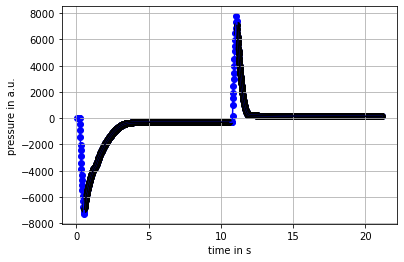

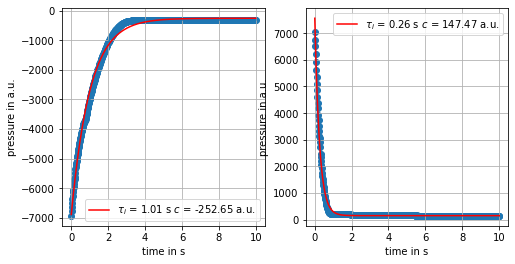

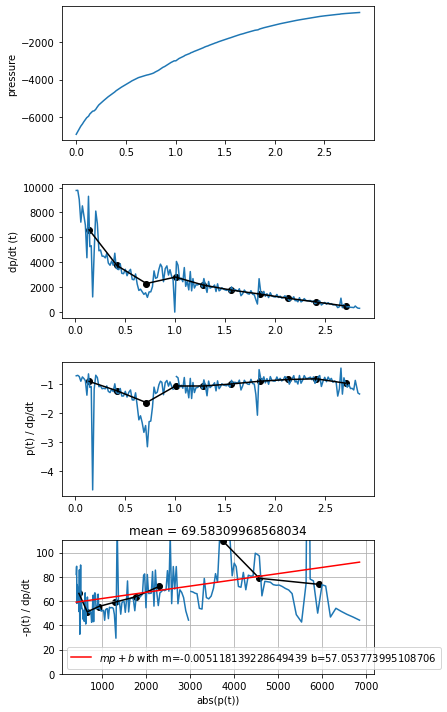

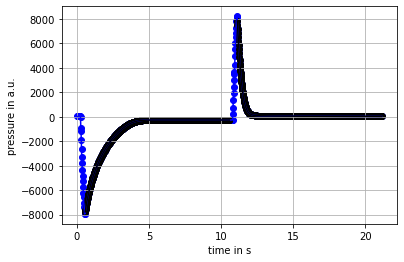

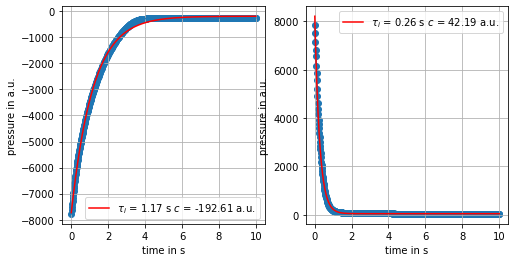

...

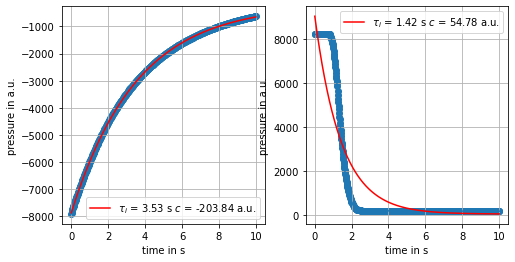

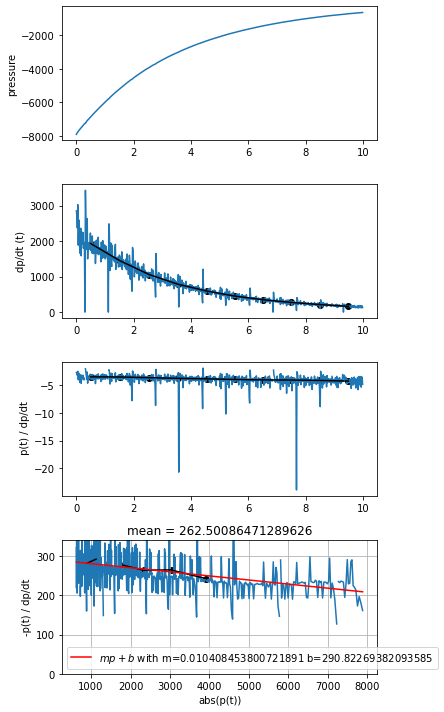

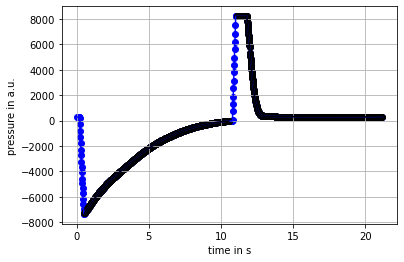

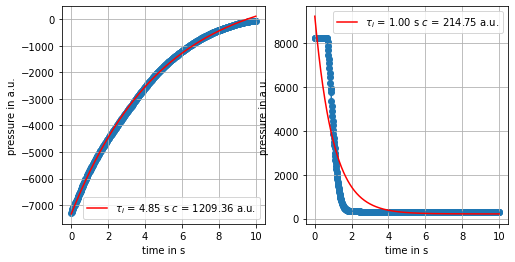

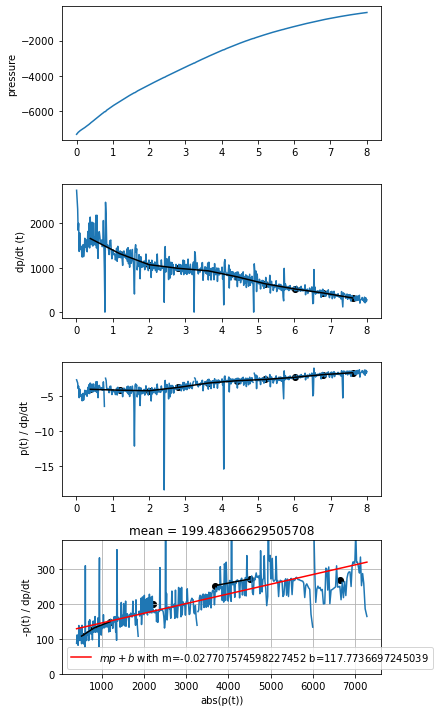

In [40]:
## what happens at different depths of the corn starch vessel (maybe the starch settles a bit at the bottom)
if False:
    left_pipette.pick_up_tip(location = tiprack.wells()[8])
    results = []
    for z in np.linspace(30,5, 6):
        evaluator = ViscosityProxyEvaluator()
        corn_starch_location = raw_material_plate.wells()[2].bottom(z=z)
        left_pipette.mix(5,200, location = corn_starch_location)
        
        result = evaluator.measure_viscosity_proxies(location = corn_starch_location,
                                                     volume_ul = 200, ## more than 200 will cause pressure sensor to run in limit
                                                     settle_time_s = 10)
        results.append(result)

aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 30
    # data points      = 643
    # variables        = 3
    chi-square         = 7065295.76
    reduced chi-square = 11039.5246
    Akaike info crit   = 5988.83254
    Bayesian info crit = 6002.23097
    R-squared          = 0.99469488
[[Variables]]
    a:   -6317.07478 +/- 21.6798931 (0.34%) (init = -500)
    tau:  1.45497992 +/- 0.00910238 (0.63%) (init = 0.01)
    c:   -281.055475 +/- 6.32460252 (2.25%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.6296
    C(a, tau) = +0.5408
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 63
    # data points      = 644
    # variables        = 3
    chi-square         = 34274002.8
    reduced chi-square = 53469.5832
    A

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 643
    # variables        = 3
    chi-square         = 1507304.91
    reduced chi-square = 2355.16392
    Akaike info crit   = 4995.48007
    Bayesian info crit = 5008.87850
    R-squared          = 0.99920636
[[Variables]]
    a:   -7931.20014 +/- 10.8381903 (0.14%) (init = -500)
    tau:  1.22368113 +/- 0.00289038 (0.24%) (init = 0.01)
    c:   -294.451296 +/- 2.66942162 (0.91%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5792
    C(tau, c) = +0.5651
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 60
    # data points      = 632
    # variables        = 3
    chi-square         = 2.9142e+08
    reduced chi-square = 463300.654
    A

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 642
    # variables        = 3
    chi-square         = 1241576.90
    reduced chi-square = 1942.99984
    Akaike info crit   = 4864.20950
    Bayesian info crit = 4877.60327
    R-squared          = 0.99945163
[[Variables]]
    a:   -7343.66320 +/- 6.97915842 (0.10%) (init = -500)
    tau:  3.54661990 +/- 0.01066579 (0.30%) (init = 0.01)
    c:   -119.887108 +/- 7.14921860 (5.96%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9170
    C(a, c)   = -0.5118
    C(a, tau) = -0.2221
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 52
    # data points      = 643
    # variables        = 3
    chi-square         = 5.2606e+08
    reduced chi-s

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 640
    # variables        = 3
    chi-square         = 612537.646
    reduced chi-square = 961.597561
    Akaike info crit   = 4398.89440
    Bayesian info crit = 4412.27881
    R-squared          = 0.99973043
[[Variables]]
    a:   -7269.69739 +/- 4.73017131 (0.07%) (init = -500)
    tau:  3.07810588 +/- 0.00593030 (0.19%) (init = 0.01)
    c:   -235.310255 +/- 4.06819766 (1.73%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8881
    C(a, c)   = -0.3586
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 47
    # data points      = 644
    # variables        = 3
    chi-square         = 6.4747e+08
    reduced chi-square = 1010088.32
    A

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 628
    # variables        = 3
    chi-square         = 1196677.59
    reduced chi-square = 1914.68415
    Akaike info crit   = 4748.98221
    Bayesian info crit = 4762.30983
    R-squared          = 0.99948373
[[Variables]]
    a:   -7458.19066 +/- 6.80941383 (0.09%) (init = -500)
    tau:  2.86821546 +/- 0.00738703 (0.26%) (init = 0.01)
    c:   -235.709460 +/- 5.25510745 (2.23%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8716
    C(a, c)   = -0.2782
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 47
    # data points      = 639
    # variables        = 3
    chi-square         = 6.0171e+08
    reduced chi-square = 946090.288
    A

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 644
    # variables        = 3
    chi-square         = 567080.731
    reduced chi-square = 884.681327
    Akaike info crit   = 4372.67950
    Bayesian info crit = 4386.08260
    R-squared          = 0.99975597
[[Variables]]
    a:   -7384.47768 +/- 4.55681476 (0.06%) (init = -500)
    tau:  3.08154371 +/- 0.00561803 (0.18%) (init = 0.01)
    c:   -155.128795 +/- 3.90109017 (2.51%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8888
    C(a, c)   = -0.3488
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 48
    # data points      = 644
    # variables        = 3
    chi-square         = 5.9344e+08
    reduced chi-square = 925805.117
    A

/tmp/ipykernel_77175/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_77175/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


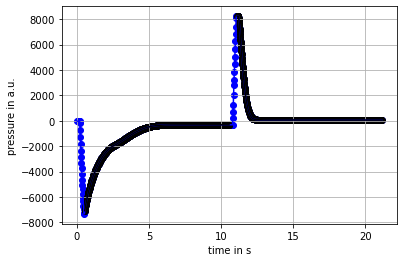

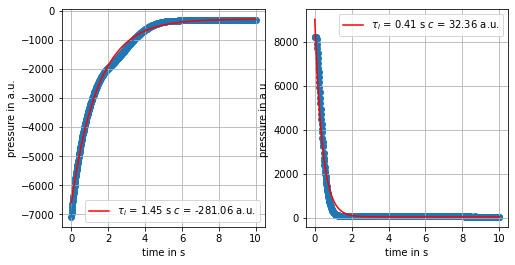

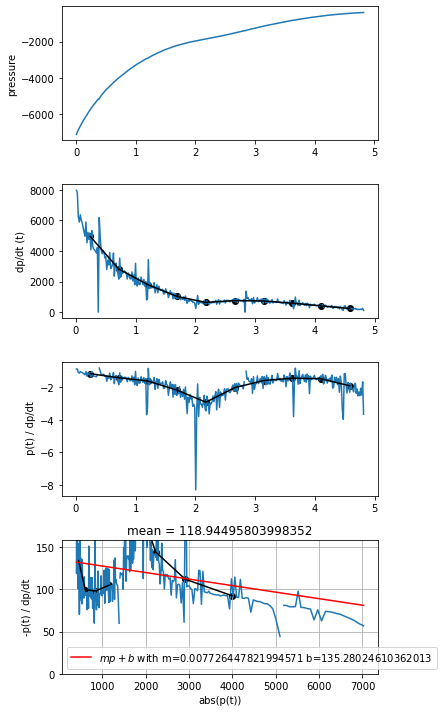

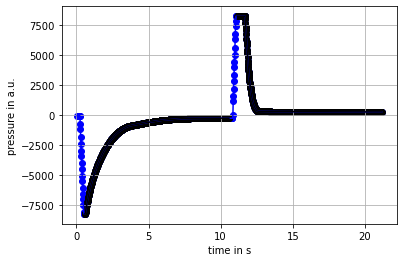

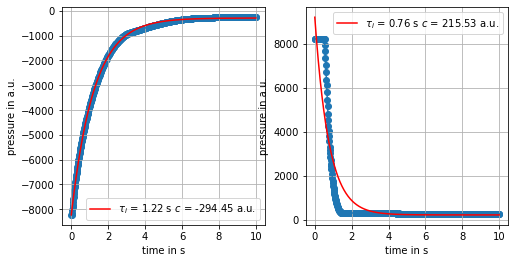

...

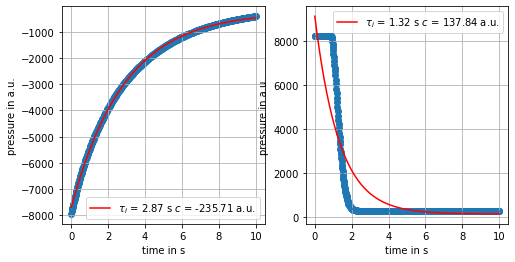

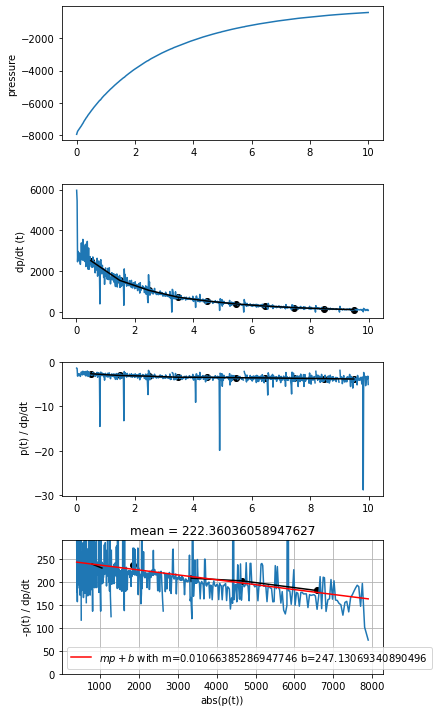

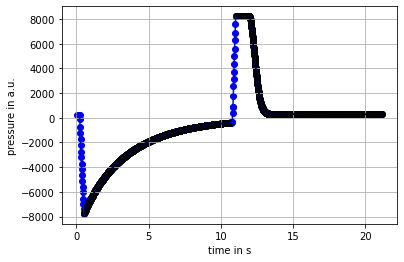

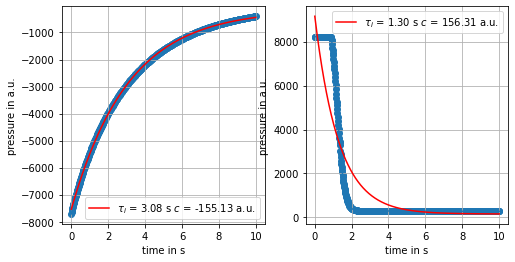

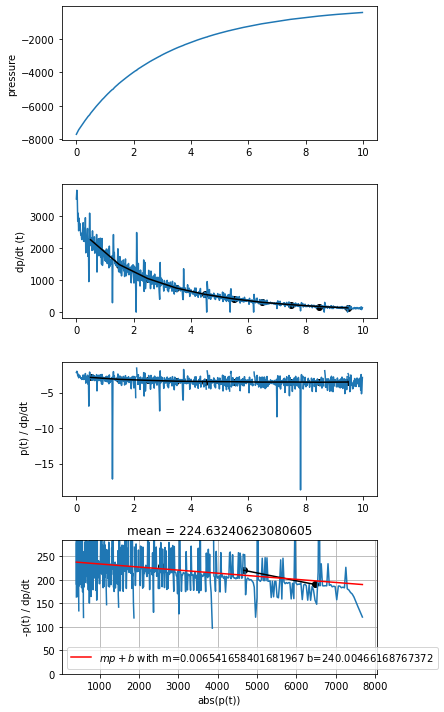

In [42]:
## the result was a bit unclear. let's do it agian. 
if True:
   # left_pipette.pick_up_tip(location = tiprack.wells()[8])
    results = []
    for z in np.linspace(30,5, 6):
        evaluator = ViscosityProxyEvaluator()
        corn_starch_location = raw_material_plate.wells()[2].bottom(z=z)
        left_pipette.mix(5,200, location = corn_starch_location)
        
        result = evaluator.measure_viscosity_proxies(location = corn_starch_location,
                                                     volume_ul = 200, ## more than 200 will cause pressure sensor to run in limit
                                                     settle_time_s = 10)
        results.append(result)

In [22]:
## check if shear-thinning absent in F1000 standard?

if False:
    
    n_well = 0
    
    results = []
    for i in range(1):
        evaluator = ViscosityProxyEvaluator()
        #evaluator.pipette.pick_up_tip(location = tiprack.wells()[n_well])
        
        result = evaluator.measure_viscosity_proxies(location = raw_material_plate["A1"].bottom(z = 25),
                                                     volume_ul = 100, settle_time_s = 30)
        results.append(result)
        
        

In [21]:
## make it work with water without error:

if False:
    
    n_well = 0
    
    results = []
    for i in range(1):
        evaluator = ViscosityProxyEvaluator()
        #evaluator.pipette.pick_up_tip(location = tiprack.wells()[n_well])
        
        result = evaluator.measure_viscosity_proxies(location = raw_material_plate["A1"].bottom(z = 25),
                                                     volume_ul = 100, settle_time_s = 10)
        results.append(result)

In [43]:
left_pipette.drop_tip()

<InstrumentContext: p1000_single_v3.5 in LEFT>

According to this measurment: the standard is much less shear-thinning than the dish-soap

In [64]:
### detect liquid height
if False:
    left_pipette.move_to(plate.wells()[0].bottom(z=20))
    left_pipette.dispense(left_pipette.current_volume)
    print("liquid height:", left_pipette.measure_liquid_height(plate.wells()[0]))
 

In [40]:
#dir(left_pipette)
if False:
    dir(protocol.robot)
    import opentrons_hardware
    dir(opentrons_hardware.instruments.)

['DEFAULT_INSTR_SERIAL_LENGTH',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 'ensure_serial_length',
 'model_versionstring_from_int']

In [76]:
print("pressure integrals:", [result.pressure_integral_corrected for result in results])
print("pressure integrals asp:", [result.pressure_integral_aspirate for result in results])
print("pressure integrals disp:", [result.pressure_integral_dispense for result in results])
print("decay_times:", [result.decay_time_aspirate for result in results])
protocol.home()
left_pipette.drop_tip()

pressure integrals: [277.2372455352688, 352.17028160680275, 234.7170957942726, 212.18594534951444, 208.16169183761485]
pressure integrals asp: [-140.3164786095731, -147.176665822215, -179.05051258554886, -146.9397452800622, -172.42222137495992]
pressure integrals disp: [414.1580124609645, 557.1638973913905, 290.38367900299636, 277.4321454189667, 243.9011623002698]
decay_times: [0.03507070074277863, 0.026173363719234066, 0.029696892020453225, 0.03339457131795731, 0.035630092336985664]


<InstrumentContext: p1000_single_v3.5 in LEFT>

## generate calibration dataset


In [15]:
protocol.home()
left_pipette.drop_tip()

<InstrumentContext: p1000_single_v3.5 in LEFT>

put standard vial with viscosity 1 mPa.s at position A1 of raw material plate
double-check that the right vial is placed!
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 21
    # data points      = 628
    # variables        = 3
    chi-square         = 10395.4048
    reduced chi-square = 16.6326477
    Akaike info crit   = 1768.53160
    Bayesian info crit = 1781.85922
    R-squared          = 0.05020674
##  Warning: uncertainties could not be estimated:
[[Variables]]
    a:   -23.4602811 (init = -500)
    tau:  6.7921e-06 (init = 0.01)
    c:   -160.282012 (init = 0)
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 61
    # data points      = 645
    # variables        = 3
    chi-square         = 12601.1847
    reduced chi-square = 19.6280136
    

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 21
    # data points      = 638
    # variables        = 3
    chi-square         = 9338.80399
    reduced chi-square = 14.7067779
    Akaike info crit   = 1718.13373
    Bayesian info crit = 1731.50874
    R-squared          = 0.04525970
##  Warning: uncertainties could not be estimated:
[[Variables]]
    a:   -21.0571432 (init = -500)
    tau:  1.2379e-04 (init = 0.01)
    c:   -166.228286 (init = 0)
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 52
    # data points      = 642
    # variables        = 3
    chi-square         = 12246.1465
    reduced chi-square = 19.1645484
    Akaike info crit   = 1898.85886
    Bayesian info crit = 1912.25263
    R-squared          = 0.77452510
[[Variables]]
    

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 635
    # variables        = 3
    chi-square         = 10779.9226
    reduced chi-square = 17.0568395
    Akaike info crit   = 1804.20295
    Bayesian info crit = 1817.56382
    R-squared          = 0.06135713
##  Warning: uncertainties could not be estimated:
[[Variables]]
    a:   -26.5663798 (init = -500)
    tau:  3.6081e-04 (init = 0.01)
    c:   -170.280544 (init = 0)
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 56
    # data points      = 640
    # variables        = 3
    chi-square         = 9347.86954
    reduced chi-square = 14.6748344
    Akaike info crit   = 1722.11876
    Bayesian info crit = 1735.50316
    R-squared          = 0.81353421
[[Variables]]
    

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 17
    # data points      = 640
    # variables        = 3
    chi-square         = 186880.657
    reduced chi-square = 293.376227
    Akaike info crit   = 3639.12468
    Bayesian info crit = 3652.50909
    R-squared          = 0.01749832
##  Warning: uncertainties could not be estimated:
[[Variables]]
    a:   -57.7368794 (init = -500)
    tau:  7.6224e-06 (init = 0.01)
    c:   -158.223204 (init = 0)
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 648
    # variables        = 3
    chi-square         = 16682.4672
    reduced chi-square = 25.8642903
    Akaike info crit   = 2110.84843
    Bayesian info crit = 2124.27010
    R-squared          = 0.78125219
[[Variables]]
    

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 24
    # data points      = 647
    # variables        = 3
    chi-square         = 11301.4665
    reduced chi-square = 17.5488610
    Akaike info crit   = 1856.64094
    Bayesian info crit = 1870.05798
    R-squared          = 0.03061549
##  Warning: uncertainties could not be estimated:
[[Variables]]
    a:   -18.9071390 (init = -500)
    tau:  1.3846e-05 (init = 0.01)
    c:   -167.497661 (init = 0)
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 31
    # data points      = 639
    # variables        = 3
    chi-square         = 11479.4515
    reduced chi-square = 18.0494520
    Akaike info crit   = 1851.69363
    Bayesian info crit = 1865.07334
    R-squared          = 0.82263549
[[Variables]]
    

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


put standard vial with viscosity 10 mPa.s at position A1 of raw material plate
double-check that the right vial is placed!
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 21
    # data points      = 628
    # variables        = 3
    chi-square         = 5505.13531
    reduced chi-square = 8.80821649
    Akaike info crit   = 1369.32298
    Bayesian info crit = 1382.65060
    R-squared          = 0.99479561
[[Variables]]
    a:   -675.624577 +/- 2.42460685 (0.36%) (init = -500)
    tau:  0.05788902 +/- 3.4084e-04 (0.59%) (init = 0.01)
    c:   -146.421434 +/- 0.11980773 (0.08%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5916
    C(tau, c) = +0.1081
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data

/usr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 643
    # variables        = 3
    chi-square         = 2220.29422
    reduced chi-square = 3.46920973
    Akaike info crit   = 802.837927
    Bayesian info crit = 816.236361
    R-squared          = 0.99789645
[[Variables]]
    a:   -689.683903 +/- 1.56007279 (0.23%) (init = -500)
    tau:  0.04904853 +/- 1.7938e-04 (0.37%) (init = 0.01)
    c:   -151.928338 +/- 0.07422724 (0.05%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5969
    C(tau, c) = +0.1008
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 635
    # variables        = 3
    chi-square         = 152572.291
    reduced chi-square = 241.411853
    A

/usr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_8737/4054997032.py:376: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (p_ax, dp_ax, dpp_ax, visc_p_ax) = plt.subplots(nrows = 4, figsize= (6,10))


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 17
    # data points      = 641
    # variables        = 3
    chi-square         = 265.195578
    reduced chi-square = 0.41566705
    Akaike info crit   = -559.722161
    Bayesian info crit = -546.333073
    R-squared          = 0.99976201
[[Variables]]
    a:   -707.381410 +/- 0.52987489 (0.07%) (init = -500)
    tau:  0.05206082 +/- 6.6295e-05 (0.13%) (init = 0.01)
    c:   -152.372257 +/- 0.02572488 (0.02%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5788
    C(tau, c) = +0.1006
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 628
    # variables        = 3
    chi-square         = 125115.610
    reduced chi-square = 200.184976
   

/usr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 629
    # variables        = 3
    chi-square         = 365.516428
    reduced chi-square = 0.58389206
    Akaike info crit   = -335.433800
    Bayesian info crit = -322.101406
    R-squared          = 0.99963981
[[Variables]]
    a:   -690.962054 +/- 0.64811922 (0.09%) (init = -500)
    tau:  0.05076856 +/- 7.8040e-05 (0.15%) (init = 0.01)
    c:   -152.929129 +/- 0.03078835 (0.02%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5880
    C(tau, c) = +0.1024
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 639
    # variables        = 3
    chi-square         = 107723.190
    reduced chi-square = 169.376085
   

/usr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 21
    # data points      = 640
    # variables        = 3
    chi-square         = 1516.70813
    reduced chi-square = 2.38101747
    Akaike info crit   = 558.210805
    Bayesian info crit = 571.595210
    R-squared          = 0.99913553
[[Variables]]
    a:   -871.156049 +/- 1.26615358 (0.15%) (init = -500)
    tau:  0.05297321 +/- 1.2567e-04 (0.24%) (init = 0.01)
    c:   -152.998271 +/- 0.06166707 (0.04%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5975
    C(tau, c) = +0.1034
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 649
    # variables        = 3
    chi-square         = 109267.173
    reduced chi-square = 169.144231
    A

/usr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


put standard vial with viscosity 50 mPa.s at position A1 of raw material plate
double-check that the right vial is placed!
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 638
    # variables        = 3
    chi-square         = 7381.18415
    reduced chi-square = 11.6239120
    Akaike info crit   = 1568.04799
    Bayesian info crit = 1581.42300
    R-squared          = 0.99988108
[[Variables]]
    a:   -2699.71984 +/- 1.56104274 (0.06%) (init = -500)
    tau:  0.26397420 +/- 2.3215e-04 (0.09%) (init = 0.01)
    c:   -140.497551 +/- 0.14258701 (0.10%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6632
    C(tau, c) = +0.2341
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 30
    # data

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 639
    # variables        = 3
    chi-square         = 31182.0293
    reduced chi-square = 49.0283480
    Akaike info crit   = 2490.23568
    Bayesian info crit = 2503.61539
    R-squared          = 0.99953082
[[Variables]]
    a:   -2769.51440 +/- 3.12996570 (0.11%) (init = -500)
    tau:  0.25394033 +/- 4.4381e-04 (0.17%) (init = 0.01)
    c:   -151.479125 +/- 0.29248812 (0.19%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6497
    C(tau, c) = +0.2341
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 640
    # variables        = 3
    chi-square         = 118395.837
    reduced chi-square = 185.864736
    A

min, max of times (asp): 0.18476295471191406 3.4598963260650635
aspiration_integral =  -5089.44622110204
min, max of times(disp): 0.25032830238342285 2.041687488555908
dispense_integral =  3824.494976919872
corrected integral:  4456.970599010956
proxy_offset, proxy_slope, proxy_mean 104.10023465633655 0.008998219074338985 90.7761832201455


/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  9.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 632
    # variables        = 3
    chi-square         = 8607.44415
    reduced chi-square = 13.6843309
    Akaike info crit   = 1656.46377
    Bayesian info crit = 1669.81044
    R-squared          = 0.99998035
[[Variables]]
    a:   -3941.93871 +/- 0.85833556 (0.02%) (init = -500)
    tau:  1.09873639 +/- 4.0676e-04 (0.04%) (init = 0.01)
    c:   -177.291063 +/- 0.19554671 (0.11%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5839
    C(tau, c) = +0.5249
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 637
    # variables        = 3
    chi-square         = 30348.8483
    reduced chi-square = 47.8688458
    Ak

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  9.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 640
    # variables        = 3
    chi-square         = 12201.7408
    reduced chi-square = 19.1550091
    Akaike info crit   = 1892.63407
    Bayesian info crit = 1906.01847
    R-squared          = 0.99997124
[[Variables]]
    a:   -3928.72250 +/- 1.03741763 (0.03%) (init = -500)
    tau:  1.09477887 +/- 4.8300e-04 (0.04%) (init = 0.01)
    c:   -180.757535 +/- 0.23085692 (0.13%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5938
    C(tau, c) = +0.5301
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 643
    # variables        = 3
    chi-square         = 32003.2236
    reduced chi-square = 50.0050368
    Ak

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  9.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 653
    # variables        = 3
    chi-square         = 10028.1291
    reduced chi-square = 15.4278909
    Akaike info crit   = 1789.71665
    Bayesian info crit = 1803.16138
    R-squared          = 0.99997719
[[Variables]]
    a:   -3950.46281 +/- 0.91660433 (0.02%) (init = -500)
    tau:  1.09554388 +/- 4.2702e-04 (0.04%) (init = 0.01)
    c:   -180.386162 +/- 0.20410454 (0.11%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5901
    C(tau, c) = +0.5261
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 638
    # variables        = 3
    chi-square         = 36318.4200
    reduced chi-square = 57.1943623
    Ak

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


put standard vial with viscosity 500 mPa.s at position A1 of raw material plate
double-check that the right vial is placed!
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  8.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 637
    # variables        = 3
    chi-square         = 14226.6161
    reduced chi-square = 22.4394575
    Akaike info crit   = 1984.58583
    Bayesian info crit = 1997.95614
    R-squared          = 0.99998088
[[Variables]]
    a:   -4207.72732 +/- 0.74119081 (0.02%) (init = -500)
    tau:  2.69241753 +/- 0.00127479 (0.05%) (init = 0.01)
    c:   -110.189592 +/- 0.51613542 (0.47%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8543
    C(a, c)   = -0.2229
    C(a, tau) = +0.1676
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  7.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 660
    # variables        = 3
    chi-square         = 17656.2072
    reduced chi-square = 26.8739836
    Akaike info crit   = 2175.15788
    Bayesian info crit = 2188.63460
    R-squared          = 0.99997644
[[Variables]]
    a:   -4252.87271 +/- 0.82035668 (0.02%) (init = -500)
    tau:  2.65310901 +/- 0.00134554 (0.05%) (init = 0.01)
    c:   -134.090723 +/- 0.55496103 (0.41%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8553
    C(a, c)   = -0.1999
    C(a, tau) = +0.1900
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 631
    # variables        = 3
    chi-square         = 41305.2808
    reduced chi-sq

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  8.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 621
    # variables        = 3
    chi-square         = 11372.1542
    reduced chi-square = 18.4015441
    Akaike info crit   = 1811.61460
    Bayesian info crit = 1824.90860
    R-squared          = 0.99998495
[[Variables]]
    a:   -4267.36061 +/- 0.67589146 (0.02%) (init = -500)
    tau:  2.66021157 +/- 0.00112794 (0.04%) (init = 0.01)
    c:   -128.725550 +/- 0.46727487 (0.36%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8506
    C(a, c)   = -0.2244
    C(a, tau) = +0.1708
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 634
    # variables        = 3
    chi-square         = 38214.9173
    reduced chi-sq

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  8.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 640
    # variables        = 3
    chi-square         = 20364.2151
    reduced chi-square = 31.9689404
    Akaike info crit   = 2220.44243
    Bayesian info crit = 2233.82684
    R-squared          = 0.99997367
[[Variables]]
    a:   -4297.69795 +/- 0.88952530 (0.02%) (init = -500)
    tau:  2.65902010 +/- 0.00146037 (0.05%) (init = 0.01)
    c:   -126.650890 +/- 0.60524629 (0.48%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8506
    C(a, c)   = -0.2085
    C(a, tau) = +0.1872
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 633
    # variables        = 3
    chi-square         = 38261.4349
    reduced chi-sq

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  7.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 627
    # variables        = 3
    chi-square         = 14005.5322
    reduced chi-square = 22.4447632
    Akaike info crit   = 1953.62574
    Bayesian info crit = 1966.94858
    R-squared          = 0.99998117
[[Variables]]
    a:   -4238.19941 +/- 0.75011143 (0.02%) (init = -500)
    tau:  2.65771837 +/- 0.00125131 (0.05%) (init = 0.01)
    c:   -129.947912 +/- 0.50996344 (0.39%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8492
    C(a, c)   = -0.2067
    C(a, tau) = +0.1910
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 639
    # variables        = 3
    chi-square         = 48854.0457
    reduced chi-sq

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


put standard vial with viscosity 1000 mPa.s at position A1 of raw material plate
double-check that the right vial is placed!
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  6.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 637
    # variables        = 3
    chi-square         = 17014.9335
    reduced chi-square = 26.8374345
    Akaike info crit   = 2098.59406
    Bayesian info crit = 2111.96437
    R-squared          = 0.99997355
[[Variables]]
    a:   -4333.03771 +/- 1.64456302 (0.04%) (init = -500)
    tau:  5.78660133 +/- 0.00566521 (0.10%) (init = 0.01)
    c:   -101.087954 +/- 1.98005414 (1.96%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9717
    C(a, c)   = -0.9332
    C(a, tau) = -0.8428
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # functio

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 631
    # variables        = 3
    chi-square         = 9887.26151
    reduced chi-square = 15.7440470
    Akaike info crit   = 1742.32057
    Bayesian info crit = 1755.66249
    R-squared          = 0.99998636
[[Variables]]
    a:   -4617.08248 +/- 1.24988196 (0.03%) (init = -500)
    tau:  5.74621952 +/- 0.00403209 (0.07%) (init = 0.01)
    c:   -128.563746 +/- 1.50533428 (1.17%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9714
    C(a, c)   = -0.9307
    C(a, tau) = -0.8388
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 629
    # variables        = 3
    chi-square         = 32951.1074
    reduced chi-squa

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 640
    # variables        = 3
    chi-square         = 9065.85482
    reduced chi-square = 14.2321112
    Akaike info crit   = 1702.51343
    Bayesian info crit = 1715.89784
    R-squared          = 0.99998760
[[Variables]]
    a:   -4625.59075 +/- 1.19220889 (0.03%) (init = -500)
    tau:  5.76539211 +/- 0.00383735 (0.07%) (init = 0.01)
    c:   -112.607211 +/- 1.43653945 (1.28%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9715
    C(a, c)   = -0.9322
    C(a, tau) = -0.8408
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 641
    # variables        = 3
    chi-square         = 32369.5658
    reduced chi-squa

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  5.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 635
    # variables        = 3
    chi-square         = 16247.0854
    reduced chi-square = 25.7074136
    Akaike info crit   = 2064.69782
    Bayesian info crit = 2078.05870
    R-squared          = 0.99997508
[[Variables]]
    a:   -4355.03631 +/- 1.58014141 (0.04%) (init = -500)
    tau:  5.71888405 +/- 0.00541628 (0.09%) (init = 0.01)
    c:   -133.598412 +/- 1.90847131 (1.43%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9714
    C(a, c)   = -0.9295
    C(a, tau) = -0.8369
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 634
    # variables        = 3
    chi-square         = 29390.2609
    reduced chi-sq

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  3.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 626
    # variables        = 3
    chi-square         = 18224.9972
    reduced chi-square = 29.2536071
    Akaike info crit   = 2116.37060
    Bayesian info crit = 2129.68865
    R-squared          = 0.99997205
[[Variables]]
    a:   -4389.30845 +/- 1.68494780 (0.04%) (init = -500)
    tau:  5.71119630 +/- 0.00569514 (0.10%) (init = 0.01)
    c:   -136.401123 +/- 2.02797723 (1.49%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9707
    C(a, c)   = -0.9284
    C(a, tau) = -0.8340
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 639
    # variables        = 3
    chi-square         = 29071.6160
    reduced chi-sq

/tmp/ipykernel_8737/4054997032.py:350: RuntimeWarning: divide by zero encountered in true_divide
  visc_proxy = -p_/dp
/tmp/ipykernel_8737/4054997032.py:386: RuntimeWarning: divide by zero encountered in true_divide
  dpp_ax.plot(t_,p_ / dp_dt )


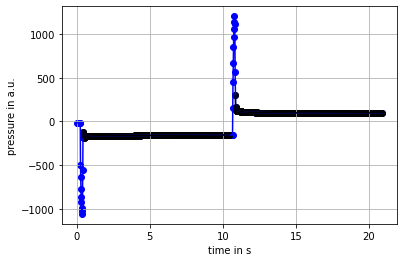

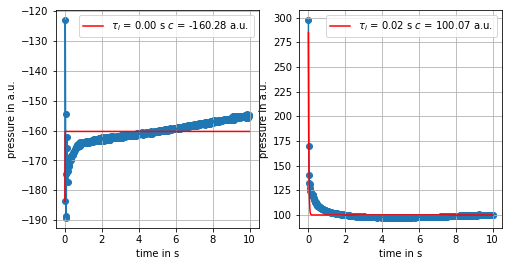

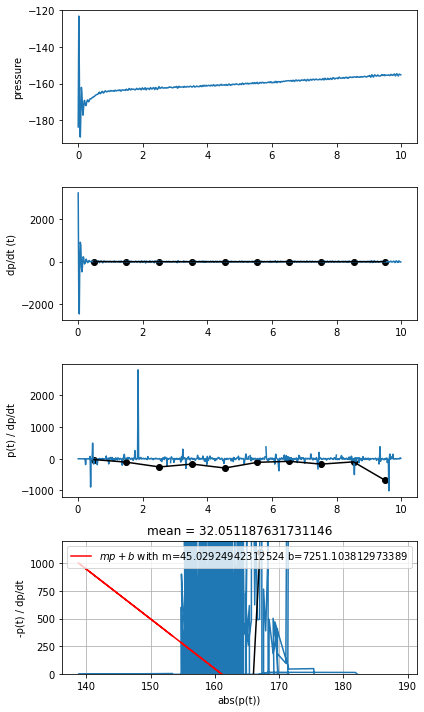

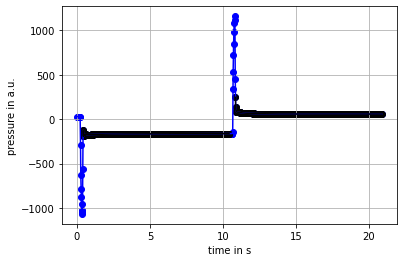

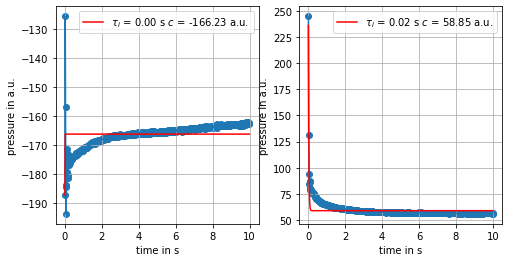

...

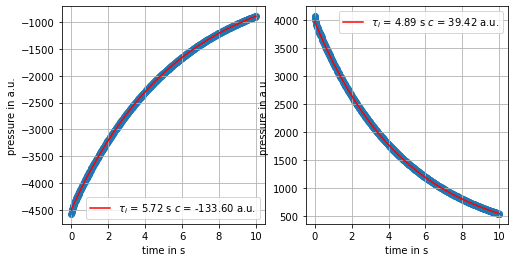

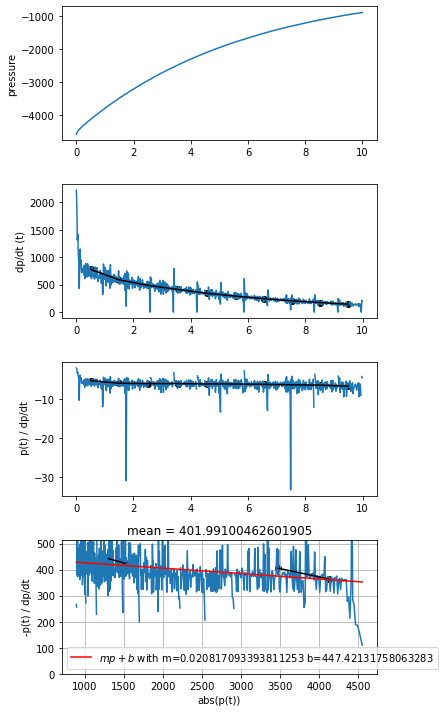

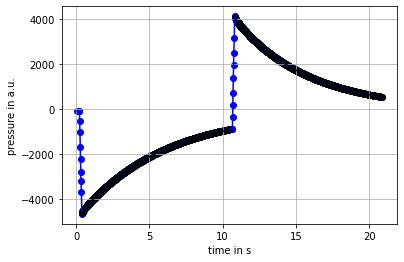

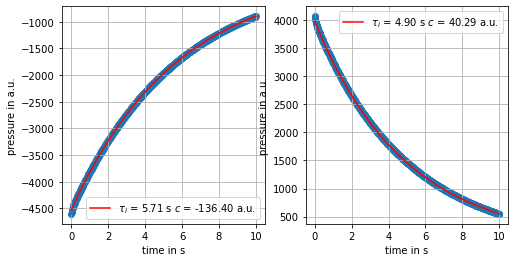

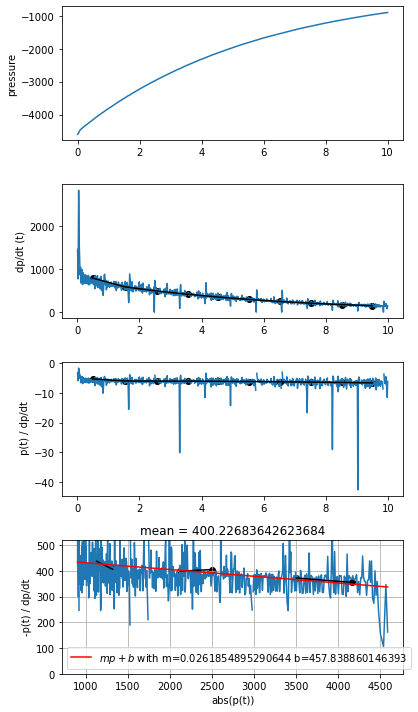

In [19]:
standard_location = raw_material_plate["A1"].bottom(z = 25)

class ViscosityCalibrationPoint(BaseModel):
    viscosity_proxy_result: ViscosityProxyResult = Field(description="measurement data for one proxy experiment")
    standard_viscosity_mPas: float = Field(description="the viscosiy of the used standard in mPas")
    i: Optional[int] = Field(description="index of the standard")
    j: Optional[int] = Field(description="index of the measurement")
    

class ViscosityCalibration(BaseModel):
    points: List[ViscosityCalibrationPoint] = Field(description="multiple measurment points", default = [])
    tip_description: str = Field(description="description of the used tip")
        

if False:
    viscosity_calibration = ViscosityCalibration(tip_description = "opentrons_flex_1000_ul_tip")
    for i, viscosity_mPas in enumerate([1,10,50,200,500,1000]):
        left_pipette.pick_up_tip(tiprack.wells()[64+i])
        input(f"put standard vial with viscosity {viscosity_mPas} mPa.s at position A1 of raw material plate")
        input(f"double-check that the right vial is placed!")
        
        for j in range(5):
            evaluator = ViscosityProxyEvaluator()
           # evaluator.pipette.pick_up_tip(location = tiprack.wells()[n_well])
            result = evaluator.measure_viscosity_proxies(location = standard_location, volume_ul = 100, settle_time_s = 10)
            point = ViscosityCalibrationPoint(
                
                viscosity_proxy_result = result,
                standard_viscosity_mPas = viscosity_mPas,
                i = i,
                j = j,
            )
            viscosity_calibration.points.append(point)
        left_pipette.drop_tip()   
        
        ## save result:
        with open("data/calibration_data_opentrons_1000ul_tip.json", 'w') as f:
            json.dump(viscosity_calibration.dict(), f)

## comments on measurement accurracy:
* The aspiration cycle should be more constant: viscous liquid still sticking to the walls of the pipette should not play a role, then. 

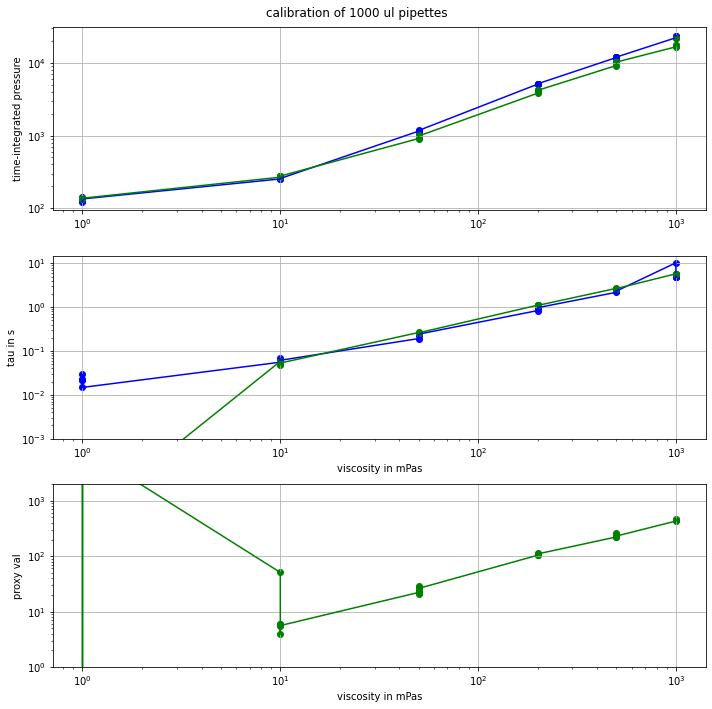

In [24]:
if False:
    aspirate_integrals = [point.viscosity_proxy_result.pressure_integral_aspirate for point in viscosity_calibration.points]
    dispense_integrals = [point.viscosity_proxy_result.pressure_integral_dispense for point in viscosity_calibration.points]

    tau_disp_list = [point.viscosity_proxy_result.decay_time_dispense for point in viscosity_calibration.points]
    tau_asp_list = [point.viscosity_proxy_result.decay_time_aspirate for point in viscosity_calibration.points]
    
    der_prox_list = [point.viscosity_proxy_result.derivative_proxy_offset for point in viscosity_calibration.points]
    
    standard_viscosities = [point.standard_viscosity_mPas for point in viscosity_calibration.points]

    fig, (int_ax, tau_ax, der_ax) = plt.subplots(nrows = 3, ncols=1, figsize = (10,10))
    int_ax.plot(standard_viscosities, np.abs(np.array(aspirate_integrals)), c="blue")
    int_ax.scatter(standard_viscosities, np.abs(np.array(aspirate_integrals)), c="blue")

    int_ax.plot(standard_viscosities, np.abs(np.array(dispense_integrals)), c="green")
    int_ax.scatter(standard_viscosities, dispense_integrals, c="green")
    int_ax.grid(True)
    int_ax.set_ylabel("time-integrated pressure")

    tau_ax.plot(standard_viscosities, tau_disp_list, color = "blue")
    tau_ax.scatter(standard_viscosities, tau_disp_list, color = "blue")

    tau_ax.plot(standard_viscosities, tau_asp_list, color ="green")
    tau_ax.scatter(standard_viscosities, tau_asp_list, color = "green")
    tau_ax.grid(True)
    tau_ax.set_ylim(0.001,15)
    
    tau_ax.set_xlabel("viscosity in mPas")
    tau_ax.set_ylabel("tau in s")
    
    der_ax.plot(standard_viscosities, der_prox_list, color ="green")
    der_ax.scatter(standard_viscosities, der_prox_list, color = "green")
    der_ax.grid(True)
    der_ax.set_ylim(1,2000)
    
    der_ax.set_xlabel("viscosity in mPas")
    der_ax.set_ylabel("proxy val")
    
    if True:
        tau_ax.set_xscale("log")
        tau_ax.set_yscale("log")

        int_ax.set_xscale("log")
        int_ax.set_yscale("log")
        
        der_ax.set_xscale("log")
        der_ax.set_yscale("log")
    fig.suptitle("calibration of 1000 ul pipettes")
    plt.tight_layout()
    
    fig.show()
    fig.savefig("visualizations/calibration_opentrons_1000um_pipettes.png")

In [86]:
## find out how to aspirate without moving
#left_pipette.pick_up_tip(tiprack.wells()[0])
#left_pipette.aspirate(50, plate.wells()[0])


<InstrumentContext: p1000_single_v3.5 in LEFT>

In [91]:
## work with pipette without moving
#left_pipette.aspirate(50)
#left_pipette.mix(10, 50)
#left_pipette.dispense(100)

<InstrumentContext: p1000_single_v3.5 in LEFT>

In [13]:
def stirr(n_well, n_rounds:int=1, r:float=1.5):
    base_location = Location(point=plate.wells()[n_well].bottom().point + Point(x=0, y=0, z=0.5), labware=None)
    angles = np.linspace(0,2*np.pi,7)
    
    locations = []
    
    for i in range(n_rounds+1):
        for angle in angles:
            x = r*np.sin(angle)
            y = r*np.cos(angle)
            z = 0 
            rel_point = Point(x=x, y=y, z=z)
            locations.append(Location(point = base_location.point+ rel_point, labware=None))
   

    ## actually move
    # move savely to start location
    left_pipette.move_to(base_location, force_direct=False)
    # stirr
    for loc in locations: 
        left_pipette.move_to(loc, force_direct=True)
    left_pipette.move_to(base_location, force_direct=True)
    
if False: 
    #left_pipette.pick_up_tip(tiprack.wells()[0])
    stirr(n_well=0, n_rounds=10)

In [14]:
def mix_and_measure(n_well, n_move_mix = 10):
    ## get pipette with same number as well
    
    if n_well >= 80:
        raise Exception("tips with n>=90 are reserved for raw materials")
    left_pipette.pick_up_tip(location = tiprack.wells()[n_well])
    
    ## touch of did not mix so well. 
    #for _ in range(n_move_mix):
        ## touch off tip for mixing
    #    left_pipette.touch_tip(plate.wells()[n_well], radius=0.75, v_offset=-10, speed = 20)
    
    
    ## mix with plunging
    left_pipette.mix(10, 50, plate.wells()[n_well].bottom(z=1.0))
    
    ## stirr for mixing 
    stirr(n_well=n_well, n_rounds=20)
    
    ## mix with plunging
    left_pipette.mix(10, 50, plate.wells()[n_well].bottom(z=1.0))
    
    ## do viscosity measurement
    evaluator = DecayTimeEvaluator()
    
    #evaluator.pipette.pick_up_tip(location = tiprack.wells()[n_well])
    measurement_result = evaluator.measure_decay_time(n_well = n_well)
    ## return pipette
    left_pipette.drop_tip(location = tiprack.wells()[n_well])
    return measurement_result
    
if False: 
    #left_pipette.drop_tip(location = tiprack.wells()[0])
    mix_and_measure(n_well = 1)

transfer 120.0 ul soap to well 0
aspiration target:  120.0  ul
aspirated. wait for settling
finally aspirated  144.0  ul
transfer 80.0 ul water to well 0
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 645
    # variables        = 3
    chi-square         = 2753.10380
    reduced chi-square = 4.28832367
    Akaike info crit   = 942.045860
    Bayesian info crit = 955.453611
    R-squared          = 0.99889608
[[Variables]]
    a:   -1247.36436 +/- 1.93008085 (0.15%) (init = -500)
    tau:  0.03038221 +/- 8.1640e-05 (0.27%) (init = 0.01)
    c:   -154.915297 +/- 0.08208029 (0.05%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5301
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 642
    # variables        = 3
    chi-square         = 144041

transfer 168.0 ul soap to well 6
aspiration target:  168.0  ul
aspirated. wait for settling
finally aspirated  192.0  ul
transfer 32.00000000000001 ul water to well 6
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 21
    # data points      = 641
    # variables        = 3
    chi-square         = 670950.138
    reduced chi-square = 1051.64598
    Akaike info crit   = 4463.14263
    Bayesian info crit = 4476.53172
    R-squared          = 0.99619861
[[Variables]]
    a:   -2451.06642 +/- 7.31365272 (0.30%) (init = -500)
    tau:  1.13844100 +/- 0.00580472 (0.51%) (init = 0.01)
    c:   -110.136715 +/- 1.73658458 (1.58%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5729
    C(tau, c) = +0.5423
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 50
    # data points      = 644
    # variables      

/tmp/ipykernel_47550/2409317377.py:111: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 42
    # data points      = 641
    # variables        = 3
    chi-square         = 112978.334
    reduced chi-square = 177.082028
    Akaike info crit   = 3321.20193
    Bayesian info crit = 3334.59102
    R-squared          = 0.99954117
[[Variables]]
    a:   -2613.96736 +/- 3.72260903 (0.14%) (init = -500)
    tau:  5.43572169 +/- 0.02095650 (0.39%) (init = 0.01)
    c:   -81.5720977 +/- 4.51741345 (5.54%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9675
    C(a, c)   = -0.9109
    C(a, tau) = -0.8033
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 648
    # variables        = 3
    chi-square         = 14241.4743
    reduced chi-square = 22.0798051
    Akaike info crit   = 2008.33491
    Bayesian info crit = 2021.75659
    R-squared 

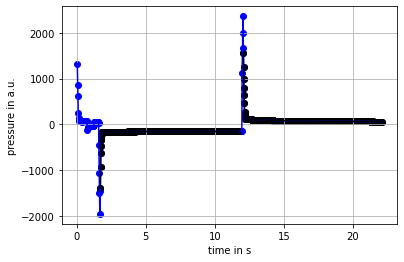

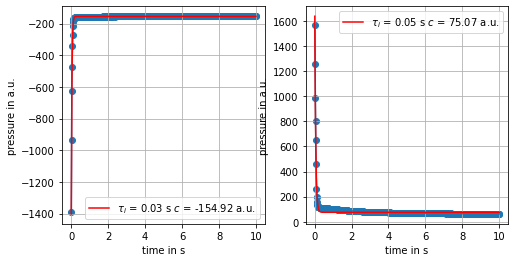

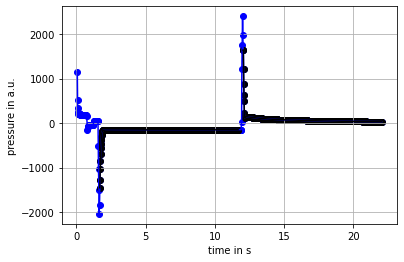

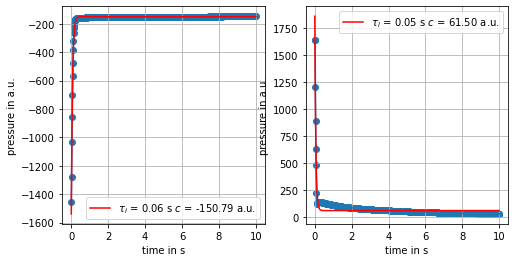

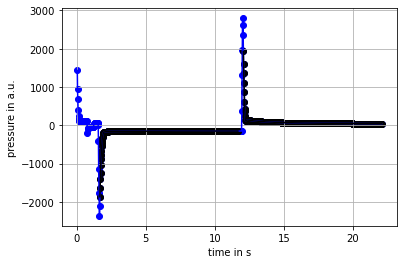

...

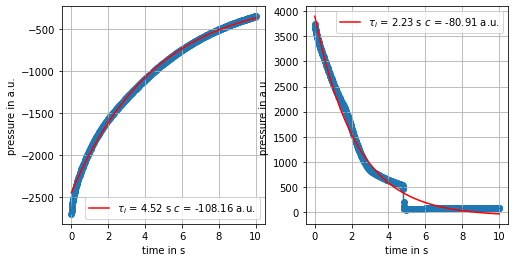

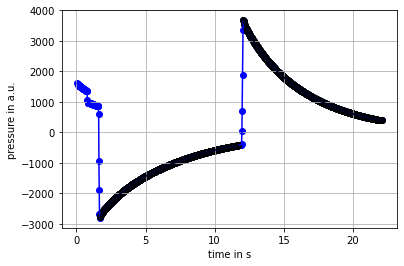

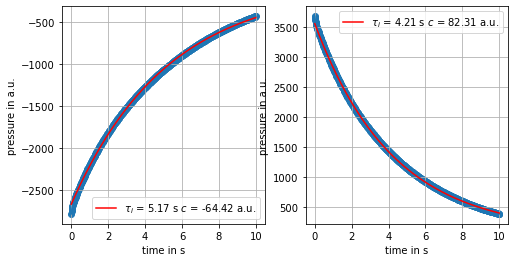

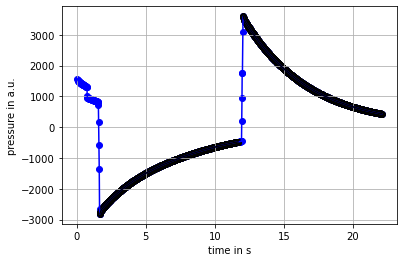

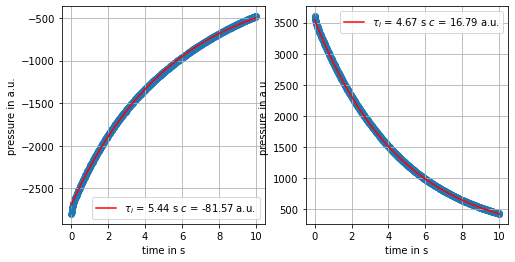

In [19]:
## do a series of mixing experiments:

soap_fractions = np.linspace(0.6,1,11)
water_fractions = 1-soap_fractions

results = []

for i in range(len(soap_fractions)):
    soap_fraction = soap_fractions[i]
    water_fraction = water_fractions[i]
    
    ## do experiment
    prepare_mix(i, soap_fraction=soap_fraction, water_fraction=water_fraction)
    result = mix_and_measure(n_well = i)
    results.append(result)


In [20]:
protocol.home()
#left_pipette.drop_tip()

In [23]:
if False:
## liquid preparation: stirring and measuring
    asp_decay_times = [result.decay_time_aspirate for result in results]
    disp_decay_times = [result.decay_time_dispense for result in results]
    fig, ax = plt.subplots()
    ax.plot(soap_fractions, asp_decay_times, color = "blue", label = "after aspirate")
    ax.scatter(soap_fractions, asp_decay_times, color="blue")
    ax.plot(soap_fractions, disp_decay_times, color = "black", label="after dispense")
    ax.scatter(soap_fractions, disp_decay_times, color="black")

    ax.set_yscale("log")
    ax.grid(True)
    ax.legend()

    ax.set_xlabel("soap fraction")
    ax.set_ylabel("pressure decay time in s")

In [27]:
#left_pipette.drop_tip(tiprack.wells()[0])
left_pipette.drop_tip()
#return_soap_tip()
#return_water_tip()
#protocol.home()

<InstrumentContext: p1000_single_v3.5 in LEFT>

# Using Bayesian optimization


In [15]:
                 
import numpy as np
from ax.service.ax_client import AxClient, ObjectiveProperties
from ax.utils.notebook.plotting import init_notebook_plotting, render
from ax.plot.slice import plot_slice
import time

In [58]:
obj1_name = "deviation"

def rising_function(x):
    y = x**2 + x**3
    return y


ax_client = AxClient()

ax_client.create_experiment(
    parameters=[
        {"name": "x1", "type": "range", "bounds": [0., 1.]},
    ],
    objectives={
        obj1_name: ObjectiveProperties(minimize=True),
    },
)


for i in range(20):

    parameterization, trial_index = ax_client.get_next_trial()
    print(parameterization)
    # extract parameters
    x1 = parameterization["x1"]

    value = rising_function(x1)
    target = 0.5
    deviation = np.abs(value-target)
    
    print(deviation)
    ax_client.complete_trial(trial_index=trial_index, raw_data=deviation)
    
    ## live feedback:
    model = ax_client.generation_strategy.model
    try:
        render(plot_slice(model, "x1", "deviation"))
    except:
        print("could not visualize results, so far")
best_parameters, metrics = ax_client.get_best_parameters()
                

[INFO 01-28 18:24:23] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 01-28 18:24:23] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter x1. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 01-28 18:24:23] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='x1', parameter_type=FLOAT, range=[0.0, 1.0])], parameter_constraints=[]).
[INFO 01-28 18:24:23] ax.modelbridge.dispatch_utils: Using Models.BOTORCH_MODULAR since there is at least one ordered parameter and there are no unordered categorical parameters.
[INFO 01-28 18:24:23] ax.modelbridge.dispatch_utils: Calculating the number of remaining initialization trials based on num_initialization_trials=None max_

{'x1': 0.6754338145256042}
0.2643510642108967
could not visualize results, so far
{'x1': 0.116215281188488}
0.4849244058088818


[INFO 01-28 18:24:24] ax.service.ax_client: Completed trial 1 with data: {'deviation': (0.484924, None)}.
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 01-28 18:24:24] ax.service.ax_client: Generated new trial 2 with parameters {'x1': 0.469041} using model Sobol.
[INFO 01-28 18:24:24] ax.service.ax_client: Completed trial 2 with data: {'deviation': (0.176812, None)}.


could not visualize results, so far
{'x1': 0.46904116310179234}
0.1768115131009259
could not visualize results, so far


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 01-28 18:24:24] ax.service.ax_client: Generated new trial 3 with parameters {'x1': 0.786047} using model Sobol.
[INFO 01-28 18:24:24] ax.service.ax_client: Completed trial 3 with data: {'deviation': (0.603546, None)}.
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 01-28 18:24:24] ax.service.ax_client: Generated new trial 4 with parameters {'x1': 0.91801} using model Sobol.


{'x1': 0.7860474064946175}
0.603546049184579
could not visualize results, so far
{'x1': 0.9180098045617342}
1.1163874211546636


[INFO 01-28 18:24:24] ax.service.ax_client: Completed trial 4 with data: {'deviation': (1.116387, None)}.


could not visualize results, so far


[INFO 01-28 18:24:29] ax.service.ax_client: Generated new trial 5 with parameters {'x1': 0.55778} using model BoTorch.
[INFO 01-28 18:24:29] ax.service.ax_client: Completed trial 5 with data: {'deviation': (0.015345, None)}.


{'x1': 0.5577804948428142}
0.01534476493723913


[INFO 01-28 18:24:37] ax.service.ax_client: Generated new trial 6 with parameters {'x1': 0.576092} using model BoTorch.
[INFO 01-28 18:24:37] ax.service.ax_client: Completed trial 6 with data: {'deviation': (0.023076, None)}.


{'x1': 0.5760916387785846}
0.023075777424742205


[INFO 01-28 18:24:44] ax.service.ax_client: Generated new trial 7 with parameters {'x1': 0.0} using model BoTorch.
[INFO 01-28 18:24:44] ax.service.ax_client: Completed trial 7 with data: {'deviation': (0.5, None)}.


{'x1': 0.0}
0.5


[INFO 01-28 18:24:53] ax.service.ax_client: Generated new trial 8 with parameters {'x1': 0.545766} using model BoTorch.
[INFO 01-28 18:24:53] ax.service.ax_client: Completed trial 8 with data: {'deviation': (0.039577, None)}.


{'x1': 0.5457659286972076}
0.03957746654261296


[INFO 01-28 18:25:03] ax.service.ax_client: Generated new trial 9 with parameters {'x1': 0.280575} using model BoTorch.
[INFO 01-28 18:25:03] ax.service.ax_client: Completed trial 9 with data: {'deviation': (0.39919, None)}.


{'x1': 0.28057471634034575}
0.39919037762640464


[INFO 01-28 18:25:13] ax.service.ax_client: Generated new trial 10 with parameters {'x1': 0.566612} using model BoTorch.
[INFO 01-28 18:25:13] ax.service.ax_client: Completed trial 10 with data: {'deviation': (0.00296, None)}.


{'x1': 0.5666123330616916}
0.002960162586262194


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/botorch/optim/optimize.py:568: RuntimeWarning:

Optimization failed in `gen_candidates_scipy` with the following warning(s):
[NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .')]
Trying again with a new set of initial conditions.

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/botorch/optim/optimize.py:568: RuntimeWarning:

Optimization fail

{'x1': 0.5339752687102538}
0.06261826425296196


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/botorch/optim/optimize.py:568: RuntimeWarning:

Optimization failed in `gen_candidates_scipy` with the following warning(s):
[NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal')]
Trying again with a new set of initial conditions.

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/botorch/optim/optimize.py:568: RuntimeWarning:

Optimization failed on the second t

{'x1': 0.5838526577946646}
0.03990991221658524


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/botorch/optim/optimize.py:568: RuntimeWarning:

Optimization failed in `gen_candidates_scipy` with the following warning(s):
[NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., a

{'x1': 0.5525441139997064}
0.02600052251125551


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/botorch/optim/optimize.py:568: RuntimeWarning:

Optimization failed in `gen_candidates_scipy` with the following warning(s):
[NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0

{'x1': 0.5623410737212979}
0.0059448143664676545


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/botorch/optim/optimize.py:568: RuntimeWarning:

Optimization failed in `gen_candidates_scipy` with the following warning(s):
[NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0

{'x1': 0.5708360289588621}
0.011862845163021829


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 18:27:59] ax.service.ax_client: Generated new trial 16 with parameters {'x1': 0.5735} using model BoTorch.
[INFO 01-28 18:27:59] ax.service.ax_client: Completed trial 16 with data: {'deviation': (0.017528, None)}.


{'x1': 0.5735002615522499}
0.017528248450987105


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 18:28:11] ax.service.ax_client: Generated new trial 17 with parameters {'x1': 0.568599} using model BoTorch.
[INFO 01-28 18:28:11] ax.service.ax_client: Completed trial 17 with data: {'deviation': (0.007137, None)}.


{'x1': 0.5685994560445361}
0.00713658267851669


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 18:28:26] ax.service.ax_client: Generated new trial 18 with parameters {'x1': 0.564485} using model BoTorch.
[INFO 01-28 18:28:26] ax.service.ax_client: Completed trial 18 with data: {'deviation': (0.001487, None)}.


{'x1': 0.5644850972437878}
0.0014871102366224576


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 18:28:38] ax.service.ax_client: Generated new trial 19 with parameters {'x1': 0.578801} using model BoTorch.
[INFO 01-28 18:28:38] ax.service.ax_client: Completed trial 19 with data: {'deviation': (0.028916, None)}.


{'x1': 0.5788013941586668}
0.028915918924334205


[WARNING 01-28 18:22:05] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


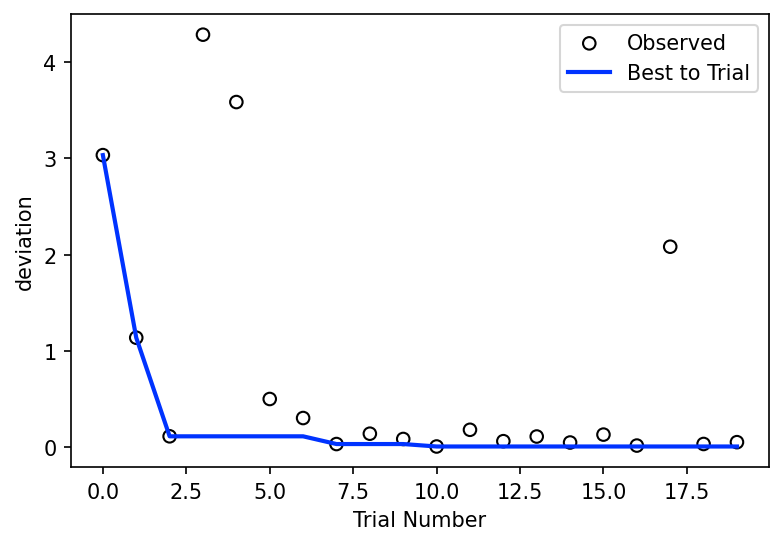

In [53]:
### visualize
import matplotlib.pyplot as plt

objectives = ax_client.objective_names
df = ax_client.get_trials_data_frame()[objectives]
trace = np.minimum.accumulate(df) # MOD: change to maxmimum
fig, ax = plt.subplots(figsize=(6, 4), dpi=150)
ax.scatter(df.index, df, ec="k", fc="none", label="Observed")
ax.plot(trace.index, trace["deviation"], color="#0033FF", lw=2, label="Best to Trial")

#ax.axvline(9.5, color="k", ls="--", lw=1) # MOD: mark end of Sobol trials

ax.set_xlabel("Trial Number")
ax.set_ylabel(objectives[0])
ax.legend()
plt.show()

# Soap Water mixing with Bayesian Optimization

[INFO 01-28 20:59:32] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 01-28 20:59:32] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter soap_fraction. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 01-28 20:59:32] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='soap_fraction', parameter_type=FLOAT, range=[0.0, 1.0])], parameter_constraints=[]).
[INFO 01-28 20:59:32] ax.modelbridge.dispatch_utils: Using Models.BOTORCH_MODULAR since there is at least one ordered parameter and there are no unordered categorical parameters.
[INFO 01-28 20:59:32] ax.modelbridge.dispatch_utils: Calculating the number of remaining initialization trials based on num_initializ

{'soap_fraction': 0.7735012173652649}
transfer 154.70024347305298 ul soap to well 0
aspiration target:  154.70024347305298  ul
aspirated. wait for settling
finally aspirated  185.70024347305298  ul
transfer 45.29975652694702 ul water to well 0
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 633
    # variables        = 3
    chi-square         = 4019.55092
    reduced chi-square = 6.38023955
    Akaike info crit   = 1176.07204
    Bayesian info crit = 1189.42345
    R-squared          = 0.99897024
[[Variables]]
    a:   -1235.10324 +/- 1.99997198 (0.16%) (init = -500)
    tau:  0.06920796 +/- 1.7813e-04 (0.26%) (init = 0.01)
    c:   -163.873841 +/- 0.10175828 (0.06%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6132
    C(tau, c) = +0.1166
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
 

[INFO 01-28 21:02:55] ax.service.ax_client: Completed trial 0 with data: {'deviation': (1.930792, None)}.
/usr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning:

Mean of empty slice.

/usr/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning:

invalid value encountered in double_scalars

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 01-28 21:02:55] ax.service.ax_client: Generated new trial 1 with parameters {'soap_fraction': 0.18189} using model Sobol.


1.9307920360153923
could not visualize results, so far
{'soap_fraction': 0.18189010489732027}
transfer 36.378020979464054 ul soap to well 1
aspiration target:  36.378020979464054  ul
aspirated. wait for settling
finally aspirated  68.37802097946405  ul
transfer 163.62197902053595 ul water to well 1
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 648
    # variables        = 3
    chi-square         = 22582.5310
    reduced chi-square = 35.0116760
    Akaike info crit   = 2307.07472
    Bayesian info crit = 2320.49639
    R-squared          = 0.98739063
[[Variables]]
    a:   -1022.19891 +/- 5.42064875 (0.53%) (init = -500)
    tau:  0.03584879 +/- 3.2634e-04 (0.91%) (init = 0.01)
    c:   -140.565424 +/- 0.23413195 (0.17%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5440
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
  

[INFO 01-28 21:06:11] ax.service.ax_client: Completed trial 1 with data: {'deviation': (1.964151, None)}.
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 01-28 21:06:12] ax.service.ax_client: Generated new trial 2 with parameters {'soap_fraction': 0.343193} using model Sobol.


1.964151205483126
could not visualize results, so far
{'soap_fraction': 0.3431930271908641}
transfer 68.63860543817282 ul soap to well 2
aspiration target:  68.63860543817282  ul
aspirated. wait for settling
finally aspirated  89.63860543817282  ul
transfer 131.36139456182718 ul water to well 2
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 644
    # variables        = 3
    chi-square         = 21644.2297
    reduced chi-square = 33.7663490
    Akaike info crit   = 2269.52827
    Bayesian info crit = 2282.93136
    R-squared          = 0.99019585
[[Variables]]
    a:   -1124.39150 +/- 5.25068099 (0.47%) (init = -500)
    tau:  0.03933882 +/- 3.0836e-04 (0.78%) (init = 0.01)
    c:   -148.012196 +/- 0.23079894 (0.16%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5401
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # 

[INFO 01-28 21:09:27] ax.service.ax_client: Completed trial 2 with data: {'deviation': (1.960661, None)}.
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 01-28 21:09:28] ax.service.ax_client: Generated new trial 3 with parameters {'soap_fraction': 0.7473} using model Sobol.


1.9606611834110315
could not visualize results, so far
{'soap_fraction': 0.7472998239099979}
transfer 149.4599647819996 ul soap to well 3
aspiration target:  149.4599647819996  ul
aspirated. wait for settling
finally aspirated  180.4599647819996  ul
transfer 50.54003521800041 ul water to well 3
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 649
    # variables        = 3
    chi-square         = 48758.0663
    reduced chi-square = 75.4768829
    Akaike info crit   = 2809.15639
    Bayesian info crit = 2822.58269
    R-squared          = 0.99816375
[[Variables]]
    a:   -2258.12100 +/- 5.04487642 (0.22%) (init = -500)
    tau:  0.14677182 +/- 5.0112e-04 (0.34%) (init = 0.01)
    c:   -159.454291 +/- 0.35146959 (0.22%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6553
    C(tau, c) = +0.1736
[[Model]]
    Model(exponential_curve)
[

[INFO 01-28 21:12:43] ax.service.ax_client: Completed trial 3 with data: {'deviation': (1.853228, None)}.
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 01-28 21:12:44] ax.service.ax_client: Generated new trial 4 with parameters {'soap_fraction': 0.60008} using model Sobol.


1.8532281773852282
could not visualize results, so far
{'soap_fraction': 0.6000804826617241}
transfer 120.01609653234482 ul soap to well 4
aspiration target:  120.01609653234482  ul
aspirated. wait for settling
finally aspirated  148.01609653234482  ul


Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.error_message: 2>)
Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.error_message: 2>)
Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.er

Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.error_message: 2>)
Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.error_message: 2>)
Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.er

Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.error_message: 2>)
Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.error_message: 2>)
Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.er

Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.error_message: 2>)
Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.error_message: 2>)
Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.er

Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.error_message: 2>)
Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.error_message: 2>)
Received error message ErrorMessage(payload=ErrorMessagePayload(message_index=UInt32Field(value=0), severity=ErrorSeverityField(value=unrecoverable), error_code=ErrorCodeField(value=over_pressure)), payload_type=<class 'opentrons_hardware.firmware_bindings.messages.payloads.ErrorMessagePayload'>, message_id=<MessageId.er

transfer 79.98390346765518 ul water to well 4
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 657
    # variables        = 3
    chi-square         = 16749.1450
    reduced chi-square = 25.6103135
    Akaike info crit   = 2133.64094
    Bayesian info crit = 2147.10399
    R-squared          = 0.99198414
[[Variables]]
    a:   -1102.66568 +/- 4.60663170 (0.42%) (init = -500)
    tau:  0.03697101 +/- 2.6396e-04 (0.71%) (init = 0.01)
    c:   -154.556481 +/- 0.19889844 (0.13%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5404
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 644
    # variables        = 3
    chi-square         = 197736.747
    reduced chi-square = 308.481665
    Akaike info crit   = 3694.18358
    Bayesian info crit = 3707.5

[INFO 01-28 21:16:02] ax.service.ax_client: Completed trial 4 with data: {'deviation': (1.963029, None)}.


1.9630289871674627
could not visualize results, so far


[INFO 01-28 21:16:08] ax.service.ax_client: Generated new trial 5 with parameters {'soap_fraction': 0.734035} using model BoTorch.


{'soap_fraction': 0.734035494410175}
transfer 146.807098882035 ul soap to well 5
aspiration target:  146.807098882035  ul
aspirated. wait for settling
finally aspirated  169.807098882035  ul
transfer 53.19290111796499 ul water to well 5
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 646
    # variables        = 3
    chi-square         = 10762.6221
    reduced chi-square = 16.7381370
    Akaike info crit   = 1823.22060
    Bayesian info crit = 1836.63300
    R-squared          = 0.99932258
[[Variables]]
    a:   -1973.88923 +/- 2.68413723 (0.14%) (init = -500)
    tau:  0.11250236 +/- 2.3080e-04 (0.21%) (init = 0.01)
    c:   -160.619819 +/- 0.16477460 (0.10%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6556
    C(tau, c) = +0.1519
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # fu

[INFO 01-28 21:19:24] ax.service.ax_client: Completed trial 5 with data: {'deviation': (1.887498, None)}.


1.8874976375911994


[INFO 01-28 21:19:32] ax.service.ax_client: Generated new trial 6 with parameters {'soap_fraction': 1.0} using model BoTorch.


{'soap_fraction': 1.0}
transfer 200.0 ul soap to well 6
aspiration target:  200.0  ul
aspirated. wait for settling
finally aspirated  185.0  ul
aspiration target:  15.0  ul
aspirated. wait for settling
finally aspirated  55.0  ul
transfer 0.0 ul water to well 6
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 34
    # data points      = 650
    # variables        = 3
    chi-square         = 33726.9494
    reduced chi-square = 52.1282061
    Akaike info crit   = 2572.90208
    Bayesian info crit = 2586.33299
    R-squared          = 0.99987172
[[Variables]]
    a:   -2895.93414 +/- 3.11255917 (0.11%) (init = -500)
    tau:  6.74388671 +/- 0.01643782 (0.24%) (init = 0.01)
    c:    12.5040552 +/- 3.62797254 (29.01%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9795
    C(a, c)   = -0.9684
    C(a, tau) = -0.9101
[[Model]]
    Model(exponential_curve)
[[Fit Stat

[INFO 01-28 21:24:13] ax.service.ax_client: Completed trial 6 with data: {'deviation': (4.743887, None)}.


4.743886707495999


[INFO 01-28 21:24:20] ax.service.ax_client: Generated new trial 7 with parameters {'soap_fraction': 0.288784} using model BoTorch.


{'soap_fraction': 0.2887837724371344}
transfer 57.756754487426875 ul soap to well 7
aspiration target:  57.756754487426875  ul
aspirated. wait for settling
finally aspirated  91.75675448742687  ul
transfer 142.2432455125731 ul water to well 7
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 645
    # variables        = 3
    chi-square         = 11504.9367
    reduced chi-square = 17.9204622
    Akaike info crit   = 1864.42636
    Bayesian info crit = 1877.83411
    R-squared          = 0.99334673
[[Variables]]
    a:   -1060.59600 +/- 3.96922731 (0.37%) (init = -500)
    tau:  0.03045059 +/- 2.0507e-04 (0.67%) (init = 0.01)
    c:   -142.769043 +/- 0.16770947 (0.12%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5051
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 3

[INFO 01-28 21:27:36] ax.service.ax_client: Completed trial 7 with data: {'deviation': (1.969549, None)}.


1.9695494113382654


[INFO 01-28 21:27:46] ax.service.ax_client: Generated new trial 8 with parameters {'soap_fraction': 0.396886} using model BoTorch.


{'soap_fraction': 0.3968857671164299}
transfer 79.37715342328599 ul soap to well 8
aspiration target:  79.37715342328599  ul
aspirated. wait for settling
finally aspirated  99.37715342328599  ul
transfer 120.62284657671402 ul water to well 8
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 30
    # data points      = 654
    # variables        = 3
    chi-square         = 11797.3439
    reduced chi-square = 18.1218800
    Akaike info crit   = 1897.70961
    Bayesian info crit = 1911.15893
    R-squared          = 0.99293999
[[Variables]]
    a:   -996.538902 +/- 3.85108631 (0.39%) (init = -500)
    tau:  0.03317112 +/- 2.3308e-04 (0.70%) (init = 0.01)
    c:   -147.187148 +/- 0.16756014 (0.11%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5183
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33

[INFO 01-28 21:31:02] ax.service.ax_client: Completed trial 8 with data: {'deviation': (1.966829, None)}.


1.9668288817105177


[INFO 01-28 21:31:11] ax.service.ax_client: Generated new trial 9 with parameters {'soap_fraction': 0.750151} using model BoTorch.


{'soap_fraction': 0.7501510852799644}
transfer 150.0302170559929 ul soap to well 9
aspiration target:  150.0302170559929  ul
aspirated. wait for settling
finally aspirated  182.0302170559929  ul
transfer 49.969782944007115 ul water to well 9
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 656
    # variables        = 3
    chi-square         = 41563.1075
    reduced chi-square = 63.6494754
    Akaike info crit   = 2727.61767
    Bayesian info crit = 2741.07615
    R-squared          = 0.99868711
[[Variables]]
    a:   -2468.40416 +/- 4.62484169 (0.19%) (init = -500)
    tau:  0.14368945 +/- 4.1047e-04 (0.29%) (init = 0.01)
    c:   -156.778055 +/- 0.32080329 (0.20%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6531
    C(tau, c) = +0.1708
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
   

[INFO 01-28 21:34:26] ax.service.ax_client: Completed trial 9 with data: {'deviation': (1.856311, None)}.


1.8563105506225512


[INFO 01-28 21:34:34] ax.service.ax_client: Generated new trial 10 with parameters {'soap_fraction': 0.708058} using model BoTorch.


{'soap_fraction': 0.7080579141956567}
transfer 141.61158283913133 ul soap to well 10
aspiration target:  141.61158283913133  ul
aspirated. wait for settling
finally aspirated  170.61158283913133  ul
transfer 58.38841716086867 ul water to well 10
measurement finished


/tmp/ipykernel_1857/2409317377.py:111: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 649
    # variables        = 3
    chi-square         = 26106.6050
    reduced chi-square = 40.4127012
    Akaike info crit   = 2403.73758
    Bayesian info crit = 2417.16388
    R-squared          = 0.99677236
[[Variables]]
    a:   -1612.03309 +/- 4.61372585 (0.29%) (init = -500)
    tau:  0.07589066 +/- 3.4705e-04 (0.46%) (init = 0.01)
    c:   -156.860539 +/- 0.25346423 (0.16%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6230
    C(tau, c) = +0.1240
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 652
    # variables        = 3
    chi-square         = 373631.794
    reduced chi-square = 575.703843
    Akaike info crit   = 4146.83995
    Bayesian info crit = 4160.28009
    R-squared          = 0.96410738
[[

[INFO 01-28 21:37:50] ax.service.ax_client: Completed trial 10 with data: {'deviation': (1.924109, None)}.


1.9241093441364914


[INFO 01-28 21:37:55] ax.service.ax_client: Generated new trial 11 with parameters {'soap_fraction': 0.0} using model BoTorch.


{'soap_fraction': 0.0}
transfer 0.0 ul soap to well 11
transfer 200.0 ul water to well 11
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 661
    # variables        = 3
    chi-square         = 97803.1122
    reduced chi-square = 148.636949
    Akaike info crit   = 3308.98913
    Bayesian info crit = 3322.47039
    R-squared          = 0.93327624
[[Variables]]
    a:   -909.934796 +/- 11.1644588 (1.23%) (init = -500)
    tau:  0.03375071 +/- 7.2251e-04 (2.14%) (init = 0.01)
    c:   -159.615979 +/- 0.47748881 (0.30%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5275
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 653
    # variables        = 3
    chi-square         = 616843.095
    reduced chi-square = 948.989377
    Akaike info crit   

[INFO 01-28 21:39:33] ax.service.ax_client: Completed trial 11 with data: {'deviation': (1.966249, None)}.


1.966249293631465


[INFO 01-28 21:39:41] ax.service.ax_client: Generated new trial 12 with parameters {'soap_fraction': 0.798792} using model BoTorch.


{'soap_fraction': 0.7987924841429713}
transfer 159.75849682859428 ul soap to well 12
aspiration target:  159.75849682859428  ul
aspirated. wait for settling
finally aspirated  194.75849682859428  ul
transfer 40.24150317140573 ul water to well 12
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 655
    # variables        = 3
    chi-square         = 29155.6957
    reduced chi-square = 44.7173248
    Akaike info crit   = 2492.22957
    Bayesian info crit = 2505.68347
    R-squared          = 0.99885830
[[Variables]]
    a:   -2255.54104 +/- 3.97187717 (0.18%) (init = -500)
    tau:  0.13855425 +/- 3.7093e-04 (0.27%) (init = 0.01)
    c:   -163.406460 +/- 0.26878857 (0.16%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6593
    C(tau, c) = +0.1666
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq

[INFO 01-28 21:42:57] ax.service.ax_client: Completed trial 12 with data: {'deviation': (1.861446, None)}.


1.8614457548677004


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/botorch/optim/optimize.py:568: RuntimeWarning:

Optimization failed in `gen_candidates_scipy` with the following warning(s):
[NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .')]
Trying again with a new set of initial conditions.

[INFO 01-28 21:43:15] ax.service.ax_client: Generated new trial 13 with parameters {'soap_fraction': 0.785002} using model BoTorch.


{'soap_fraction': 0.7850019796126027}
transfer 157.00039592252054 ul soap to well 13
aspiration target:  157.00039592252054  ul
aspirated. wait for settling
finally aspirated  193.00039592252054  ul
transfer 42.99960407747947 ul water to well 13
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 661
    # variables        = 3
    chi-square         = 126375.610
    reduced chi-square = 192.060198
    Akaike info crit   = 3478.40482
    Bayesian info crit = 3491.88608
    R-squared          = 0.99572421
[[Variables]]
    a:   -2368.32103 +/- 7.90140290 (0.33%) (init = -500)
    tau:  0.14072000 +/- 7.2955e-04 (0.52%) (init = 0.01)
    c:   -158.086047 +/- 0.55493193 (0.35%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6432
    C(tau, c) = +0.1707
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq

[INFO 01-28 21:46:30] ax.service.ax_client: Completed trial 13 with data: {'deviation': (1.85928, None)}.


1.8592799977568168


[INFO 01-28 21:46:40] ax.service.ax_client: Generated new trial 14 with parameters {'soap_fraction': 0.81707} using model BoTorch.


{'soap_fraction': 0.8170695102153552}
transfer 163.41390204307103 ul soap to well 14
aspiration target:  163.41390204307103  ul
aspirated. wait for settling
finally aspirated  192.0  ul
transfer 36.58609795692895 ul water to well 14
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 646
    # variables        = 3
    chi-square         = 156883.965
    reduced chi-square = 243.987504
    Akaike info crit   = 3554.13060
    Bayesian info crit = 3567.54300
    R-squared          = 0.99651491
[[Variables]]
    a:   -2419.05607 +/- 7.49000135 (0.31%) (init = -500)
    tau:  0.22800002 +/- 0.00106624 (0.47%) (init = 0.01)
    c:   -151.935308 +/- 0.64504422 (0.42%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6578
    C(tau, c) = +0.2204
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # functi

[INFO 01-28 21:49:56] ax.service.ax_client: Completed trial 14 with data: {'deviation': (1.772, None)}.


1.7719999808577007


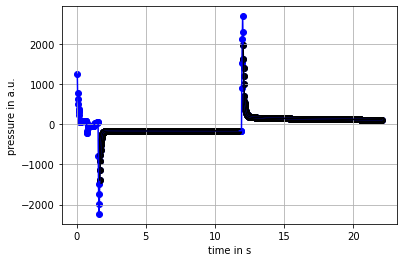

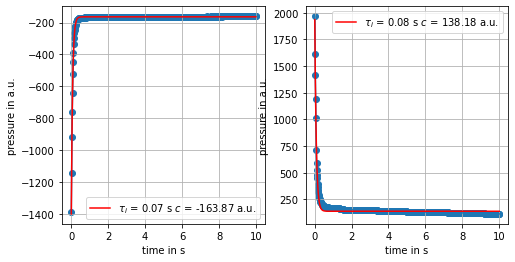

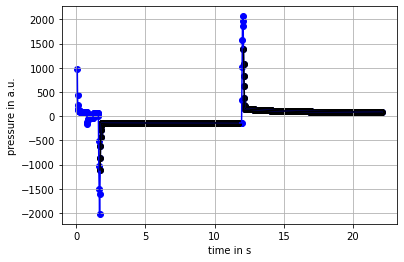

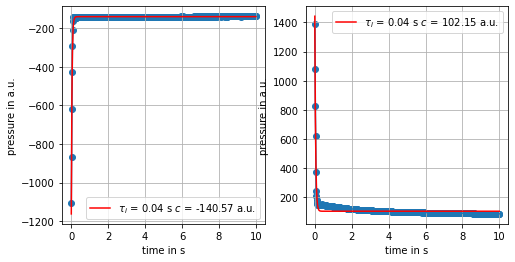

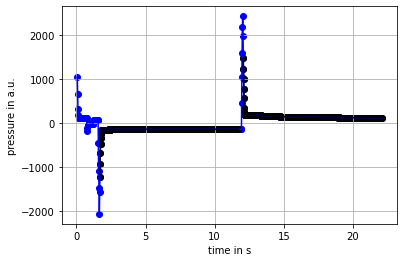

...

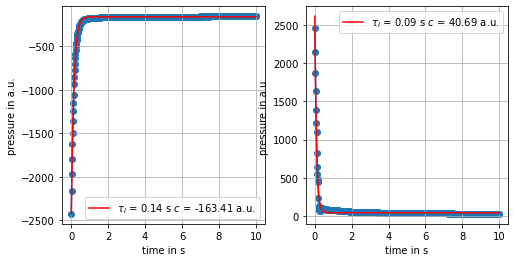

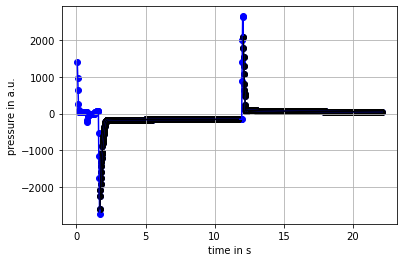

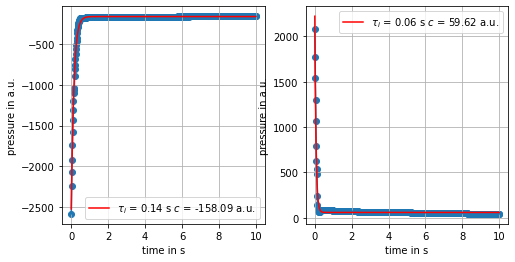

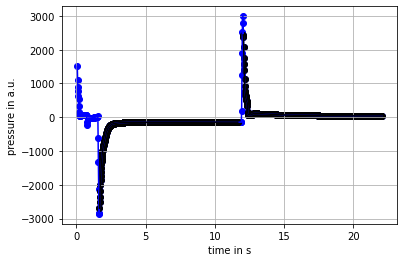

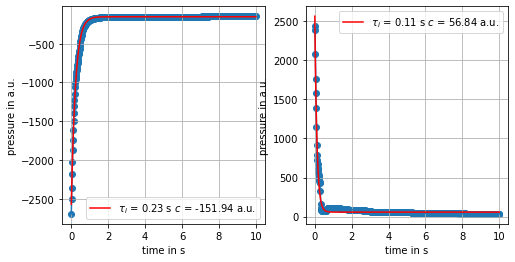

In [16]:
obj1_name = "deviation"


ax_client = AxClient()

ax_client.create_experiment(
    parameters=[
        {"name": "soap_fraction", "type": "range", "bounds": [0., 1.]},
    ],
    objectives={
        obj1_name: ObjectiveProperties(minimize=True),
    },
)

prameterizations = []
results = []


for i in range(15):

    parameterization, trial_index = ax_client.get_next_trial()
    print(parameterization)
    # extract parameters
    soap_fraction = parameterization["soap_fraction"]
    
    ## do experiment
    prepare_mix(i, soap_fraction=soap_fraction, water_fraction=1-soap_fraction)
    result = mix_and_measure(n_well = i)
    results.append(result)
    
    value = result.decay_time_aspirate
    target = 2.0 
    deviation = np.abs(value-target)
    
    print(deviation)
    ax_client.complete_trial(trial_index=trial_index, raw_data=deviation)
    
    ## live feedback:
    model = ax_client.generation_strategy.model
    try:
        render(plot_slice(model, "soap_fraction", "deviation"))
    except:
        print("could not visualize results, so far")
best_parameters, metrics = ax_client.get_best_parameters()

[INFO 01-28 21:54:51] ax.service.ax_client: Generated new trial 16 with parameters {'soap_fraction': 0.83086} using model BoTorch.


{'soap_fraction': 0.830860200903833}
transfer 166.1720401807666 ul soap to well 15
aspiration target:  166.1720401807666  ul
aspirated. wait for settling
finally aspirated  195.0  ul
transfer 33.82795981923341 ul water to well 15
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 655
    # variables        = 3
    chi-square         = 804446.026
    reduced chi-square = 1233.81292
    Akaike info crit   = 4665.19442
    Bayesian info crit = 4678.64832
    R-squared          = 0.99122427
[[Variables]]
    a:   -2350.95439 +/- 11.3200421 (0.48%) (init = -500)
    tau:  0.55247621 +/- 0.00408693 (0.74%) (init = 0.01)
    c:   -147.597993 +/- 1.55362713 (1.05%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6437
    C(tau, c) = +0.3524
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function 

[INFO 01-28 21:58:08] ax.service.ax_client: Completed trial 16 with data: {'deviation': (1.447524, None)}.


1.4475237908043597


[INFO 01-28 21:58:15] ax.service.ax_client: Generated new trial 17 with parameters {'soap_fraction': 0.840127} using model BoTorch.


{'soap_fraction': 0.8401274831067979}
transfer 168.02549662135957 ul soap to well 16
aspiration target:  168.02549662135957  ul
aspirated. wait for settling
finally aspirated  190.0  ul
transfer 31.974503378640428 ul water to well 16
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 49
    # data points      = 644
    # variables        = 3
    chi-square         = 2658290.76
    reduced chi-square = 4147.09947
    Akaike info crit   = 5367.61889
    Bayesian info crit = 5381.02199
    R-squared          = 0.97768407
[[Variables]]
    a:   -2638.94641 +/- 20.7804267 (0.79%) (init = -500)
    tau:  0.57642061 +/- 0.00692013 (1.20%) (init = 0.01)
    c:   -185.777273 +/- 2.89220550 (1.56%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6525
    C(tau, c) = +0.3596
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # funct

[INFO 01-28 22:01:31] ax.service.ax_client: Completed trial 17 with data: {'deviation': (1.423579, None)}.


1.4235793921334654


[INFO 01-28 22:01:40] ax.service.ax_client: Generated new trial 18 with parameters {'soap_fraction': 0.853337} using model BoTorch.


{'soap_fraction': 0.8533368130065767}
transfer 170.66736260131535 ul soap to well 17
aspiration target:  170.66736260131535  ul
aspirated. wait for settling
finally aspirated  192.0  ul
transfer 29.332637398684657 ul water to well 17
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 657
    # variables        = 3
    chi-square         = 726424.870
    reduced chi-square = 1110.74139
    Akaike info crit   = 4610.39156
    Bayesian info crit = 4623.85461
    R-squared          = 0.99402526
[[Variables]]
    a:   -3149.21036 +/- 12.7359809 (0.40%) (init = -500)
    tau:  0.38456804 +/- 0.00233461 (0.61%) (init = 0.01)
    c:   -120.692666 +/- 1.41458881 (1.17%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6619
    C(tau, c) = +0.2896
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # funct

[INFO 01-28 22:04:56] ax.service.ax_client: Completed trial 18 with data: {'deviation': (1.615432, None)}.


1.6154319576205982


[INFO 01-28 22:05:07] ax.service.ax_client: Generated new trial 19 with parameters {'soap_fraction': 0.837872} using model BoTorch.


{'soap_fraction': 0.8378723699712304}
transfer 167.57447399424606 ul soap to well 18
aspiration target:  167.57447399424606  ul
aspirated. wait for settling
finally aspirated  199.0  ul
transfer 32.42552600575392 ul water to well 18
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 656
    # variables        = 3
    chi-square         = 137427.575
    reduced chi-square = 210.455704
    Akaike info crit   = 3512.11765
    Bayesian info crit = 3525.57613
    R-squared          = 0.99629880
[[Variables]]
    a:   -2335.97759 +/- 7.37522624 (0.32%) (init = -500)
    tau:  0.18643554 +/- 9.0982e-04 (0.49%) (init = 0.01)
    c:   -133.885058 +/- 0.58895864 (0.44%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6552
    C(tau, c) = +0.1969
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # functi

[INFO 01-28 22:08:22] ax.service.ax_client: Completed trial 19 with data: {'deviation': (1.813564, None)}.


1.8135644589982274


[INFO 01-28 22:08:30] ax.service.ax_client: Generated new trial 20 with parameters {'soap_fraction': 0.872416} using model BoTorch.


{'soap_fraction': 0.8724155773427104}
transfer 174.48311546854208 ul soap to well 19
aspiration target:  174.48311546854208  ul
aspirated. wait for settling
finally aspirated  198.0  ul
transfer 25.51688453145793 ul water to well 19
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 49
    # data points      = 658
    # variables        = 3
    chi-square         = 3359762.73
    reduced chi-square = 5129.40875
    Akaike info crit   = 5624.11980
    Bayesian info crit = 5637.58741
    R-squared          = 0.94496749
[[Variables]]
    a:   -1447.00743 +/- 17.0388041 (1.18%) (init = -500)
    tau:  1.02886126 +/- 0.02009532 (1.95%) (init = 0.01)
    c:   -152.961243 +/- 3.64122941 (2.38%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5990
    C(tau, c) = +0.5085
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # functi

[INFO 01-28 22:11:44] ax.service.ax_client: Completed trial 20 with data: {'deviation': (0.971139, None)}.


0.9711387442511692


[INFO 01-28 22:11:54] ax.service.ax_client: Generated new trial 21 with parameters {'soap_fraction': 0.892552} using model BoTorch.


{'soap_fraction': 0.8925521815933303}
transfer 178.51043631866605 ul soap to well 20
aspiration target:  178.51043631866605  ul
aspirated. wait for settling
finally aspirated  197.0  ul
transfer 21.489563681333944 ul water to well 20
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 656
    # variables        = 3
    chi-square         = 2514638.01
    reduced chi-square = 3850.90048
    Akaike info crit   = 5418.96998
    Bayesian info crit = 5432.42846
    R-squared          = 0.98082206
[[Variables]]
    a:   -3204.36395 +/- 23.3550000 (0.73%) (init = -500)
    tau:  0.41763694 +/- 0.00453843 (1.09%) (init = 0.01)
    c:   -151.590699 +/- 2.65337988 (1.75%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6606
    C(tau, c) = +0.3026
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # funct

[INFO 01-28 22:15:08] ax.service.ax_client: Completed trial 21 with data: {'deviation': (1.582363, None)}.


1.582363057685197


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 22:15:17] ax.service.ax_client: Generated new trial 22 with parameters {'soap_fraction': 0.500281} using model BoTorch.


{'soap_fraction': 0.5002807091396705}
transfer 100.0561418279341 ul soap to well 21
aspiration target:  100.0561418279341  ul
aspirated. wait for settling
finally aspirated  136.05614182793408  ul
transfer 99.9438581720659 ul water to well 21
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 30
    # data points      = 650
    # variables        = 3
    chi-square         = 8188.28923
    reduced chi-square = 12.6557793
    Akaike info crit   = 1652.76714
    Bayesian info crit = 1666.19806
    R-squared          = 0.99592906
[[Variables]]
    a:   -1124.87151 +/- 3.30092362 (0.29%) (init = -500)
    tau:  0.02937017 +/- 1.5686e-04 (0.53%) (init = 0.01)
    c:   -152.403562 +/- 0.14039416 (0.09%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5161
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 2

[INFO 01-28 22:18:32] ax.service.ax_client: Completed trial 22 with data: {'deviation': (1.97063, None)}.


1.9706298279959993


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 22:18:41] ax.service.ax_client: Generated new trial 23 with parameters {'soap_fraction': 0.881498} using model BoTorch.


{'soap_fraction': 0.8814984655476841}
transfer 176.2996931095368 ul soap to well 22
aspiration target:  176.2996931095368  ul
aspirated. wait for settling
finally aspirated  191.0  ul
transfer 23.700306890463185 ul water to well 22
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 652
    # variables        = 3
    chi-square         = 543180.686
    reduced chi-square = 836.950210
    Akaike info crit   = 4390.79958
    Bayesian info crit = 4404.23972
    R-squared          = 0.99674060
[[Variables]]
    a:   -2277.78484 +/- 6.18575826 (0.27%) (init = -500)
    tau:  1.29648878 +/- 0.00621610 (0.48%) (init = 0.01)
    c:   -94.8129424 +/- 1.62671297 (1.72%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.5869
    C(a, tau) = +0.5628
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # functio

[INFO 01-28 22:21:57] ax.service.ax_client: Completed trial 23 with data: {'deviation': (0.703511, None)}.


0.7035112176429252


[INFO 01-28 22:22:08] ax.service.ax_client: Generated new trial 24 with parameters {'soap_fraction': 0.091077} using model BoTorch.


{'soap_fraction': 0.09107714380615667}
transfer 18.215428761231333 ul soap to well 23
aspiration target:  18.215428761231333  ul
aspirated. wait for settling
finally aspirated  57.21542876123134  ul
transfer 181.78457123876868 ul water to well 23
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 659
    # variables        = 3
    chi-square         = 85430.1128
    reduced chi-square = 130.228830
    Akaike info crit   = 3211.85733
    Bayesian info crit = 3225.32950
    R-squared          = 0.98169177
[[Variables]]
    a:   -1501.90434 +/- 9.78673964 (0.65%) (init = -500)
    tau:  0.04624761 +/- 5.0497e-04 (1.09%) (init = 0.01)
    c:   -133.783501 +/- 0.44858585 (0.34%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5749
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals  

[INFO 01-28 22:25:22] ax.service.ax_client: Completed trial 24 with data: {'deviation': (1.953752, None)}.


1.9537523900329516


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 22:25:32] ax.service.ax_client: Generated new trial 25 with parameters {'soap_fraction': 0.903605} using model BoTorch.


{'soap_fraction': 0.9036046550505127}
transfer 180.72093101010253 ul soap to well 24
aspiration target:  180.72093101010253  ul
aspirated. wait for settling
finally aspirated  197.0  ul
transfer 19.279068989897464 ul water to well 24
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 668
    # variables        = 3
    chi-square         = 2924895.83
    reduced chi-square = 4398.33959
    Akaike info crit   = 5606.83347
    Bayesian info crit = 5620.34634
    R-squared          = 0.98417775
[[Variables]]
    a:   -2280.84283 +/- 13.2693531 (0.58%) (init = -500)
    tau:  1.48079083 +/- 0.01590892 (1.07%) (init = 0.01)
    c:   -154.571514 +/- 3.95571012 (2.56%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.6370
    C(a, tau) = +0.5345
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # funct

[INFO 01-28 22:28:47] ax.service.ax_client: Completed trial 25 with data: {'deviation': (0.519209, None)}.


0.5192091736357745


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 22:28:57] ax.service.ax_client: Generated new trial 26 with parameters {'soap_fraction': 0.913656} using model BoTorch.


{'soap_fraction': 0.9136555515403385}
transfer 182.7311103080677 ul soap to well 25
aspiration target:  182.7311103080677  ul
aspirated. wait for settling
finally aspirated  191.0  ul
transfer 17.268889691932298 ul water to well 25
measurement finished


/tmp/ipykernel_1857/2409317377.py:111: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 49
    # data points      = 653
    # variables        = 3
    chi-square         = 10732565.4
    reduced chi-square = 16511.6391
    Akaike info crit   = 6344.81208
    Bayesian info crit = 6358.25681
    R-squared          = 0.90628364
[[Variables]]
    a:   -1580.07230 +/- 20.8888945 (1.32%) (init = -500)
    tau:  2.36127334 +/- 0.07580423 (3.21%) (init = 0.01)
    c:   -272.263982 +/- 11.8220560 (4.34%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8158
    C(a, tau) = +0.2995
    C(a, c)   = -0.1294
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 656
    # variables        = 3
    chi-square         = 7942267.21
    reduced chi-square = 12162.7369
    Akaike info crit   = 6173.41585
    Bayesian info crit = 6186.87433
    R-squared 

[INFO 01-28 22:32:13] ax.service.ax_client: Completed trial 26 with data: {'deviation': (0.361273, None)}.


0.36127334341523776


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 22:32:22] ax.service.ax_client: Generated new trial 27 with parameters {'soap_fraction': 0.922294} using model BoTorch.


{'soap_fraction': 0.9222937653436615}
transfer 184.4587530687323 ul soap to well 26
aspiration target:  184.4587530687323  ul
aspirated. wait for settling
finally aspirated  196.0  ul
transfer 15.541246931267704 ul water to well 26
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 655
    # variables        = 3
    chi-square         = 5704606.15
    reduced chi-square = 8749.39594
    Akaike info crit   = 5948.25777
    Bayesian info crit = 5961.71168
    R-squared          = 0.96362096
[[Variables]]
    a:   -1889.61126 +/- 15.0458093 (0.80%) (init = -500)
    tau:  2.39232793 +/- 0.04674235 (1.95%) (init = 0.01)
    c:   -287.053973 +/- 8.67062386 (3.02%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8172
    C(a, tau) = +0.2945
    C(a, c)   = -0.1351
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method  

[INFO 01-28 22:35:37] ax.service.ax_client: Completed trial 27 with data: {'deviation': (0.392328, None)}.


0.3923279263663835


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 22:35:50] ax.service.ax_client: Generated new trial 28 with parameters {'soap_fraction': 0.929791} using model BoTorch.


{'soap_fraction': 0.9297905147406765}
transfer 185.95810294813532 ul soap to well 27
aspiration target:  185.95810294813532  ul
aspirated. wait for settling
finally aspirated  196.0  ul
transfer 14.041897051864694 ul water to well 27
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 652
    # variables        = 3
    chi-square         = 62437.4140
    reduced chi-square = 96.2055686
    Akaike info crit   = 2980.34276
    Bayesian info crit = 2993.78289
    R-squared          = 0.99979305
[[Variables]]
    a:   -2654.51106 +/- 1.51082927 (0.06%) (init = -500)
    tau:  3.33214912 +/- 0.00582693 (0.17%) (init = 0.01)
    c:   -105.547100 +/- 1.43351708 (1.36%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9054
    C(a, c)   = -0.4392
    C(a, tau) = -0.1242
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method

[INFO 01-28 22:39:06] ax.service.ax_client: Completed trial 28 with data: {'deviation': (1.332149, None)}.


1.3321491211818488


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 22:39:19] ax.service.ax_client: Generated new trial 29 with parameters {'soap_fraction': 0.908564} using model BoTorch.


{'soap_fraction': 0.9085637203678438}
transfer 181.71274407356876 ul soap to well 28
aspiration target:  181.71274407356876  ul
aspirated. wait for settling
finally aspirated  189.0  ul
transfer 18.287255926431236 ul water to well 28
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 49
    # data points      = 653
    # variables        = 3
    chi-square         = 6376041.56
    reduced chi-square = 9809.29470
    Akaike info crit   = 6004.77202
    Bayesian info crit = 6018.21675
    R-squared          = 0.94246394
[[Variables]]
    a:   -1663.08028 +/- 18.3042933 (1.10%) (init = -500)
    tau:  1.75458405 +/- 0.03859238 (2.20%) (init = 0.01)
    c:   -283.179291 +/- 6.76136886 (2.39%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.7034
    C(a, tau) = +0.4740
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # funct

[INFO 01-28 22:42:35] ax.service.ax_client: Completed trial 29 with data: {'deviation': (0.245416, None)}.


0.24541594629352947


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 22:42:48] ax.service.ax_client: Generated new trial 30 with parameters {'soap_fraction': 0.899428} using model BoTorch.


{'soap_fraction': 0.8994283191323675}
transfer 179.88566382647352 ul soap to well 29
aspiration target:  179.88566382647352  ul
aspirated. wait for settling
finally aspirated  195.0  ul
transfer 20.114336173526493 ul water to well 29
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 649
    # variables        = 3
    chi-square         = 2023701.91
    reduced chi-square = 3132.66549
    Akaike info crit   = 5227.20909
    Bayesian info crit = 5240.63539
    R-squared          = 0.98457052
[[Variables]]
    a:   -1737.62355 +/- 9.00595350 (0.52%) (init = -500)
    tau:  3.70039988 +/- 0.06128772 (1.66%) (init = 0.01)
    c:   -109.484844 +/- 9.68202768 (8.84%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9245
    C(a, c)   = -0.5789
    C(a, tau) = -0.3113
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method

[INFO 01-28 22:46:03] ax.service.ax_client: Completed trial 30 with data: {'deviation': (1.7004, None)}.


1.700399883600347


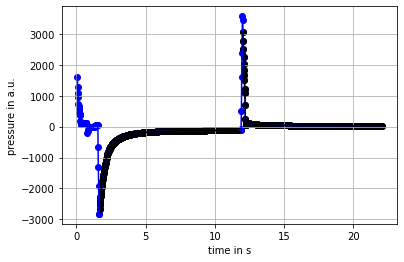

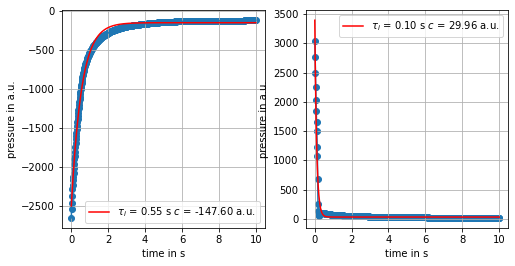

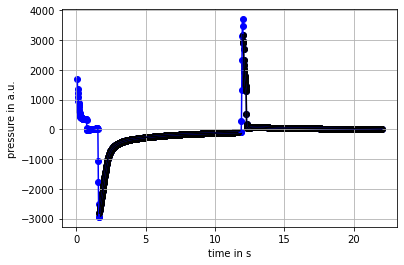

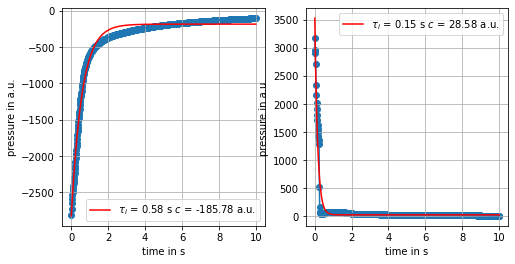

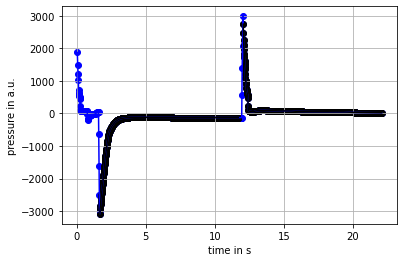

...

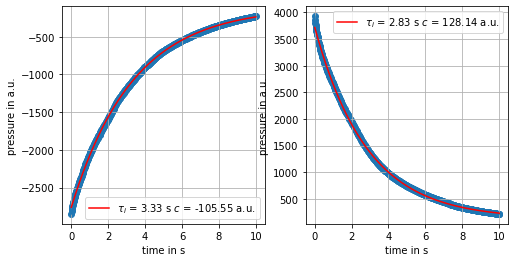

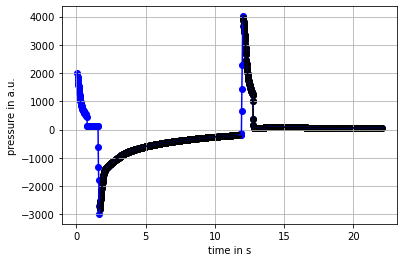

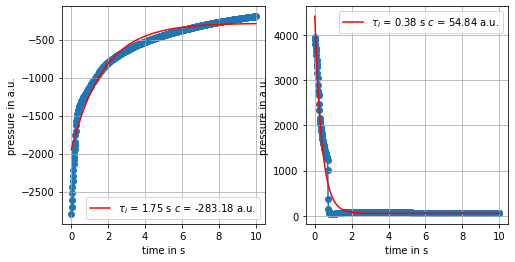

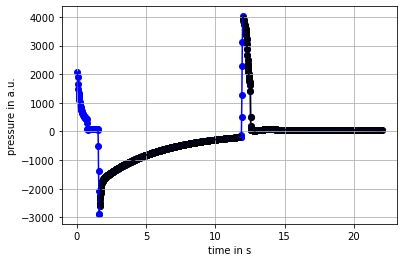

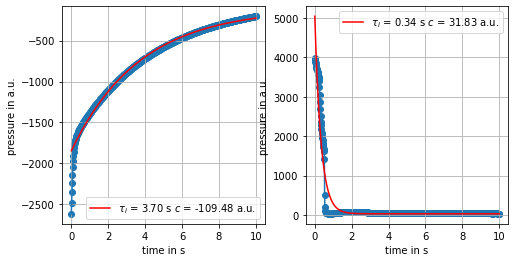

In [19]:
### continue further
for i in range(15,30):

    parameterization, trial_index = ax_client.get_next_trial()
    print(parameterization)
    # extract parameters
    soap_fraction = parameterization["soap_fraction"]
    
    ## do experiment
    prepare_mix(i, soap_fraction=soap_fraction, water_fraction=1-soap_fraction)
    result = mix_and_measure(n_well = i)
    results.append(result)
    
    value = result.decay_time_aspirate
    target = 2.0 
    deviation = np.abs(value-target)
    
    print(deviation)
    ax_client.complete_trial(trial_index=trial_index, raw_data=deviation)
    
    ## live feedback:
    model = ax_client.generation_strategy.model
    try:
        render(plot_slice(model, "soap_fraction", "deviation"))
    except:
        print("could not visualize results, so far")
best_parameters, metrics = ax_client.get_best_parameters()

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 22:47:23] ax.service.ax_client: Generated new trial 31 with parameters {'soap_fraction': 0.448657} using model BoTorch.


{'soap_fraction': 0.4486569712616607}
transfer 89.73139425233214 ul soap to well 30
aspiration target:  89.73139425233214  ul
aspirated. wait for settling
finally aspirated  126.73139425233214  ul
transfer 110.26860574766786 ul water to well 30
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 659
    # variables        = 3
    chi-square         = 16825.2845
    reduced chi-square = 25.6482995
    Akaike info crit   = 2141.10367
    Bayesian info crit = 2154.57584
    R-squared          = 0.99170923
[[Variables]]
    a:   -1092.12445 +/- 4.67282515 (0.43%) (init = -500)
    tau:  0.03449279 +/- 2.4885e-04 (0.72%) (init = 0.01)
    c:   -149.356183 +/- 0.19869710 (0.13%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5512
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   =

[INFO 01-28 22:50:38] ax.service.ax_client: Completed trial 31 with data: {'deviation': (1.965507, None)}.


1.9655072077614393


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/botorch/optim/optimize.py:568: RuntimeWarning:

Optimization failed in `gen_candidates_scipy` with the following warning(s):
[NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal')]
Trying again with a new set of initial conditions.

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/botorch/optim/optimize.py:568: RuntimeWarning:

Optimization failed on the second try, after generating a new set of initial 

{'soap_fraction': 0.9180525415460574}
transfer 183.6105083092115 ul soap to well 31
aspiration target:  183.6105083092115  ul
aspirated. wait for settling
finally aspirated  195.0  ul
transfer 16.389491690788518 ul water to well 31
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 647
    # variables        = 3
    chi-square         = 3282755.25
    reduced chi-square = 5097.44604
    Akaike info crit   = 5526.10523
    Bayesian info crit = 5539.52227
    R-squared          = 0.97982966
[[Variables]]
    a:   -2035.55007 +/- 12.8695041 (0.63%) (init = -500)
    tau:  1.88737888 +/- 0.02492579 (1.32%) (init = 0.01)
    c:   -247.893680 +/- 5.19821456 (2.10%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.7324
    C(a, tau) = +0.4476
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # functio

[INFO 01-28 22:54:20] ax.service.ax_client: Completed trial 32 with data: {'deviation': (0.112621, None)}.


0.11262111762239502


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 22:54:31] ax.service.ax_client: Generated new trial 33 with parameters {'soap_fraction': 0.655948} using model BoTorch.


{'soap_fraction': 0.6559480176874195}
transfer 131.1896035374839 ul soap to well 32
aspiration target:  131.1896035374839  ul
aspirated. wait for settling
finally aspirated  168.1896035374839  ul
transfer 68.8103964625161 ul water to well 32
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 656
    # variables        = 3
    chi-square         = 18329.8603
    reduced chi-square = 28.0702302
    Akaike info crit   = 2190.56261
    Bayesian info crit = 2204.02109
    R-squared          = 0.99167021
[[Variables]]
    a:   -1082.09148 +/- 4.68105472 (0.43%) (init = -500)
    tau:  0.04241320 +/- 3.0996e-04 (0.73%) (init = 0.01)
    c:   -160.353677 +/- 0.20858103 (0.13%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5591
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25

[INFO 01-28 22:57:45] ax.service.ax_client: Completed trial 33 with data: {'deviation': (1.957587, None)}.


1.957586804696713


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/botorch/optim/optimize.py:568: RuntimeWarning:

Optimization failed in `gen_candidates_scipy` with the following warning(s):
[NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0

{'soap_fraction': 0.23546313371953848}
transfer 47.092626743907694 ul soap to well 33
aspiration target:  47.092626743907694  ul
aspirated. wait for settling
finally aspirated  87.09262674390769  ul
transfer 152.90737325609228 ul water to well 33
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 666
    # variables        = 3
    chi-square         = 68485.6303
    reduced chi-square = 103.296577
    Akaike info crit   = 3091.63764
    Bayesian info crit = 3105.14151
    R-squared          = 0.97474304
[[Variables]]
    a:   -1159.57350 +/- 8.79727743 (0.76%) (init = -500)
    tau:  0.04272299 +/- 5.4285e-04 (1.27%) (init = 0.01)
    c:   -145.656833 +/- 0.39728075 (0.27%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5666
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals  

[INFO 01-28 23:01:31] ax.service.ax_client: Completed trial 34 with data: {'deviation': (1.957277, None)}.


1.9572770093715646


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 23:01:41] ax.service.ax_client: Generated new trial 35 with parameters {'soap_fraction': 0.550261} using model BoTorch.


{'soap_fraction': 0.5502609520407439}
transfer 110.05219040814877 ul soap to well 34
aspiration target:  110.05219040814877  ul
aspirated. wait for settling
finally aspirated  150.05219040814876  ul
transfer 89.94780959185123 ul water to well 34
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 34
    # data points      = 648
    # variables        = 3
    chi-square         = 13793.4475
    reduced chi-square = 21.3851899
    Akaike info crit   = 1987.62174
    Bayesian info crit = 2001.04341
    R-squared          = 0.99445152
[[Variables]]
    a:   -1141.26492 +/- 4.02798810 (0.35%) (init = -500)
    tau:  0.04258399 +/- 2.5868e-04 (0.61%) (init = 0.01)
    c:   -161.991992 +/- 0.18318714 (0.11%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5528
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   

[INFO 01-28 23:04:55] ax.service.ax_client: Completed trial 35 with data: {'deviation': (1.957416, None)}.


1.9574160144786061


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/botorch/optim/optimize.py:568: RuntimeWarning:

Optimization failed in `gen_candidates_scipy` with the following warning(s):
[NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), NumericalWarning('A not p.d., added jitter of 1.0e-08 to the diagonal'), OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2 and message ABNORMAL: .'), Numeric

{'soap_fraction': 0.911133085175009}
transfer 182.2266170350018 ul soap to well 35
aspiration target:  182.2266170350018  ul
aspirated. wait for settling
finally aspirated  200.0  ul
transfer 17.7733829649982 ul water to well 35
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 660
    # variables        = 3
    chi-square         = 300268.221
    reduced chi-square = 457.029256
    Akaike info crit   = 4045.32645
    Bayesian info crit = 4058.80317
    R-squared          = 0.94556655
[[Variables]]
    a:   -1109.65765 +/- 13.4925739 (1.22%) (init = -500)
    tau:  0.10568965 +/- 0.00202015 (1.91%) (init = 0.01)
    c:   -100.490923 +/- 0.85091536 (0.85%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6382
    C(tau, c) = +0.1488
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function e

[INFO 01-28 23:08:43] ax.service.ax_client: Completed trial 36 with data: {'deviation': (1.89431, None)}.


1.894310353296184


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 23:08:56] ax.service.ax_client: Generated new trial 37 with parameters {'soap_fraction': 0.896389} using model BoTorch.


{'soap_fraction': 0.8963888525250018}
transfer 179.27777050500035 ul soap to well 36
aspiration target:  179.27777050500035  ul
aspirated. wait for settling
finally aspirated  200.0  ul
transfer 20.722229494999645 ul water to well 36
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 658
    # variables        = 3
    chi-square         = 46929.8825
    reduced chi-square = 71.6486755
    Akaike info crit   = 2813.82087
    Bayesian info crit = 2827.28849
    R-squared          = 0.99077382
[[Variables]]
    a:   -1185.53035 +/- 5.84134081 (0.49%) (init = -500)
    tau:  0.09439157 +/- 7.1857e-04 (0.76%) (init = 0.01)
    c:   -100.669642 +/- 0.33643195 (0.33%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6437
    C(tau, c) = +0.1388
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # funct

[INFO 01-28 23:12:10] ax.service.ax_client: Completed trial 37 with data: {'deviation': (1.905608, None)}.


1.9056084273781952


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning:

A not p.d., added jitter of 1.0e-08 to the diagonal

[INFO 01-28 23:12:22] ax.service.ax_client: Generated new trial 38 with parameters {'soap_fraction': 0.143136} using model BoTorch.


{'soap_fraction': 0.14313587226130628}
transfer 28.627174452261254 ul soap to well 37
aspiration target:  28.627174452261254  ul
aspirated. wait for settling
finally aspirated  68.62717445226126  ul


KeyboardInterrupt: 

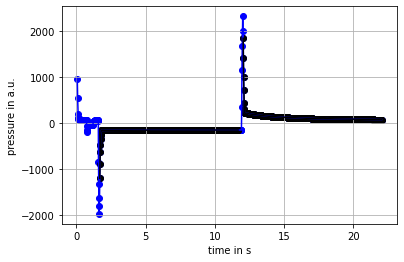

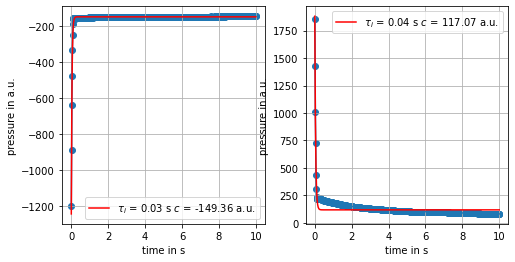

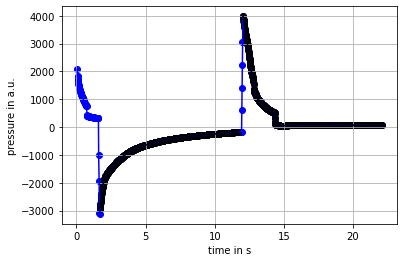

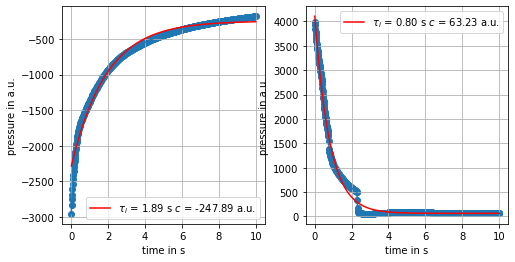

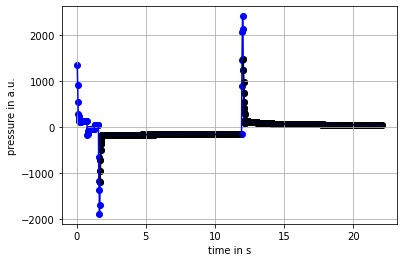

...

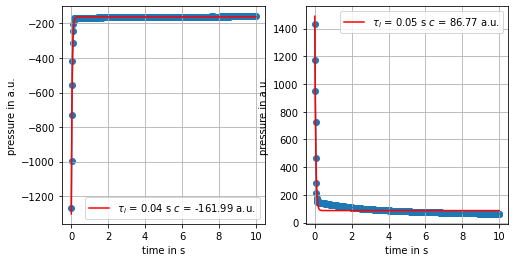

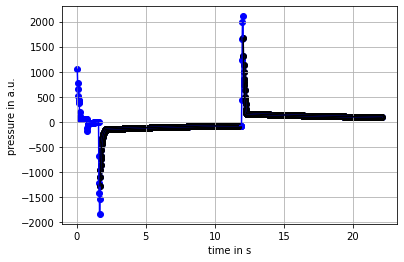

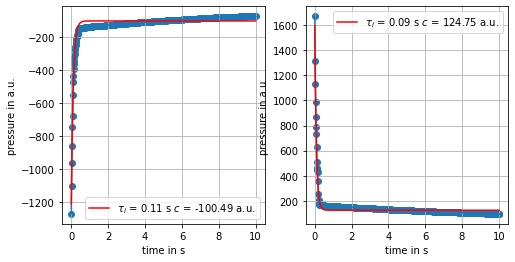

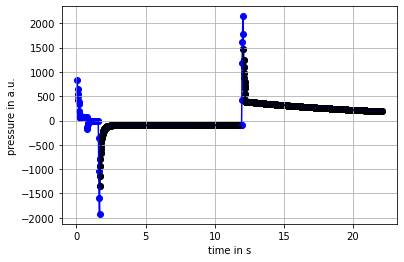

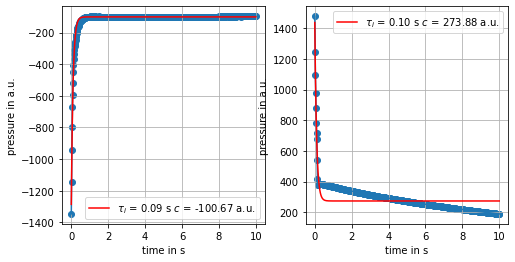

In [20]:
### continue further
for i in range(30,40):

    parameterization, trial_index = ax_client.get_next_trial()
    print(parameterization)
    # extract parameters
    soap_fraction = parameterization["soap_fraction"]
    
    ## do experiment
    prepare_mix(i, soap_fraction=soap_fraction, water_fraction=1-soap_fraction)
    result = mix_and_measure(n_well = i)
    results.append(result)
    
    value = result.decay_time_aspirate
    target = 2.0 
    deviation = np.abs(value-target)
    
    print(deviation)
    ax_client.complete_trial(trial_index=trial_index, raw_data=deviation)
    
    ## live feedback:
    model = ax_client.generation_strategy.model
    try:
        render(plot_slice(model, "soap_fraction", "deviation"))
    except:
        print("could not visualize results, so far")

## Die Seife war leer! deswegen sind die letzten Punkte falsch. 

[WARNING 01-28 23:19:17] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


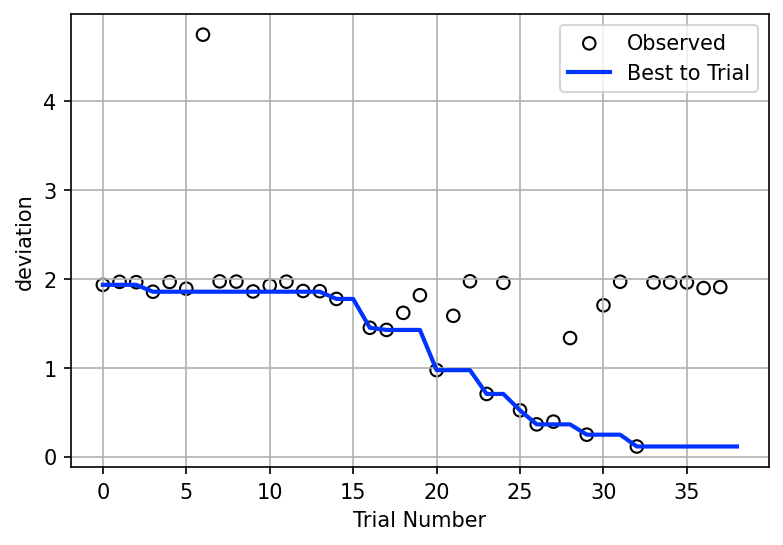

In [25]:
### visualize
import matplotlib.pyplot as plt

objectives = ax_client.objective_names
df = ax_client.get_trials_data_frame()[objectives]

trace = np.fmin.accumulate(df) # 
fig, ax = plt.subplots(figsize=(6, 4), dpi=150)
ax.scatter(df.index, df, ec="k", fc="none", label="Observed")
ax.plot(trace.index, trace["deviation"], color="#0033FF", lw=2, label="Best to Trial")

#ax.axvline(9.5, color="k", ls="--", lw=1) # MOD: mark end of Sobol trials

ax.set_xlabel("Trial Number")
ax.set_ylabel(objectives[0])
ax.legend()
ax.grid()
plt.show()

In [26]:
best_trial_index = ax_client.get_trials_data_frame()[obj1_name].idxmax()
print(best_trial_index)
print(ax_client.get_best_parameters())

[WARNING 01-28 23:21:34] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


6
({'soap_fraction': 0.911133085175009}, ({'deviation': 0.9966645314165775}, {'deviation': {'deviation': 0.014091945009944032}}))


In [27]:
left_pipette.drop_tip()

<InstrumentContext: p1000_single_v3.5 in LEFT>